In [1]:
# WEB DEV TEAM PLEASE DELETE BEFORE PUBLISHING - DS TEAM PLEASE KEEP IN THE FINAL VERSION OF THE USE CASE

from IPython.core.display import HTML
HTML("""
<style>
@import url('https://fonts.googleapis.com/css2?family=Poppins:wght@600;700&family=Inter:wght@400;500&display=swap');
body,p,li,div{font-family:'Inter',sans-serif}
body{counter-reset:h2counter}
.usecase-header-bar,.usecase-title,.usecase-section-heading,.usecase-sub-section-heading,.usecase-sub-sub-section-heading,.usecase-unnumbered-heading{font-family:'Poppins',sans-serif}
.usecase-header-bar{padding:16px 20px;background-color:#059669;color:#fff;border-radius:6px 6px 0 0}
.usecase-title{font-size:1.9em;font-weight:800}
.usecase-details{padding-left:20px;padding-bottom:8px;padding-top:8px;font-size:1.1em;color:#121212}
.usecase-section-heading,.usecase-unnumbered-heading{font-weight:700;font-size:1.35em;color:#059669;padding:14px 4px 6px 4px;border-bottom:3px solid #2DBE6C;margin-top:10px}
.usecase-section-heading::before{content:none!important}
.usecase-sub-section-heading{font-weight:600;font-size:1.15em;color:#059669;margin-top:8px}
.usecase-sub-section-heading::before{content:none!important}
.usecase-sub-sub-section-heading{font-weight:500;font-size:1.05em;color:#059669;margin-top:6px}
.usecase-sub-sub-section-heading::before{content:none!important}
.usecase-body{font-size:1em;color:#121212;line-height:1.6;margin-bottom:8px}
.usecase-list{line-height:1.7}
.usecase-list ul,.usecase-list ol{padding-left:24px;margin-top:8px;margin-bottom:12px}
.usecase-list li{margin-bottom:6px}
.usecase-datasets{background-color:rgba(5,150,105,.06);border-left:4px solid #059669;padding:12px 20px;border-radius:0 4px 4px 0;margin-top:12px}
.usecase-datasets ul{margin-top:8px;margin-bottom:8px}
.usecase-contents a,.usecase-datasets a{color:#059669;text-decoration:none}
.usecase-datasets a{font-weight:500}
.usecase-contents a:hover,.usecase-datasets a:hover{text-decoration:underline}
.usecase-contents{line-height:1.9;padding-left:20px}
</style>
""")

<div class="usecase-header-bar">
    <div class="usecase-title">Enhancing Pedestrian Safety in Melbourne's Urban Areas 2024</div>
</div>

<div class="usecase-details"><b>Authored by: </b>Dinuk</div>
<div class="usecase-details"><b>Date Created: </b>Trimester 1, 2024</div>
<div class="usecase-details"><b>Time to Complete:</b> 90 mins</div>
<div class="usecase-details"><b>Level: </b>Intermediate</div>
<div class="usecase-details"><b>Pre-requisite Skills: </b>Python, Machine Learning, Geospatial Data</div>

<div id="scenario" class="usecase-unnumbered-heading"><b>Scenario</b></div>

<div class="usecase-body">As a city planner working on pedestrian safety in Melbourne, I want to understand which streets are steep, when and where pedestrian traffic is heaviest, and how weather conditions relate to pedestrian activity, so that I can identify higher-risk areas and recommend walking routes that avoid unnecessary elevation change.</div>

<div class="usecase-body">This use case aims to answer the following questions:</div>

<div class="usecase-list">

- How does weather affect pedestrian traffic volume across the day, and which weather variables matter most?
- Which footpaths in Melbourne are steepest, and how can a walking route between two streets be chosen to minimise elevation change?

</div>

<div id="what-this-teaches" class="usecase-unnumbered-heading"><b>What this use case will teach you</b></div>

<div class="usecase-body">By the end of this use case you will be able to:</div>

<div class="usecase-list">

- Retrieve and combine data from several open data APIs and an external weather API
- Prepare time-series pedestrian and weather data for analysis, including merging on timestamp and location
- Explore relationships between weather conditions and pedestrian traffic using correlation and regression
- Check for multicollinearity between predictors using the Variance Inflation Factor
- Encode categorical data for use in a regression model, and evaluate that model's performance
- Work with GeoJSON spatial data to visualise footpath steepness across a city
- Use OpenRouteService to calculate and compare walking routes between two points

</div>

<div id="background" class="usecase-unnumbered-heading"><b>Background</b></div>

<div class="usecase-body">In modern urban environments, pedestrian safety is a crucial concern for city planners and public officials. As cities grow and traffic increases, ensuring safe and accessible pedestrian pathways becomes increasingly complex, requiring an understanding of the geographic features, traffic patterns and environmental conditions that influence pedestrian safety.</div>

<div class="usecase-body">This use case takes a data-driven approach to the problem, bringing together weather data, pedestrian traffic counts and footpath topography from several sources. By integrating and analysing this data, it becomes possible to identify how weather conditions relate to pedestrian activity, and to identify footpaths where steep terrain may make walking more difficult or hazardous, particularly for less mobile pedestrians.</div>

<div id="data-sets" class="usecase-unnumbered-heading"><b>Data Sets</b></div>

<div class="usecase-body">This use case draws on six datasets from the City of Melbourne Open Data platform, retrieved through the Melbourne Testbed v2.1 export API, plus weather data from the external Open-Meteo API. The footpath steepness and street names datasets are also used as local GeoJSON files (stored in this repository's dependency folder) for the spatial mapping and routing sections.</div>

<div class="usecase-datasets">

- <a href="https://data.melbourne.vic.gov.au/explore/dataset/footpath-steepness/information/">Footpath Steepness</a>
- <a href="https://data.melbourne.vic.gov.au/explore/dataset/microclimate-sensors-data/information/">Microclimate Sensors Data</a>
- <a href="https://data.melbourne.vic.gov.au/explore/dataset/pedestrian-counting-system-monthly-counts-per-hour/information/">Pedestrian Counting System (monthly counts per hour)</a>
- <a href="https://data.melbourne.vic.gov.au/explore/dataset/pedestrian-counting-system-past-hour-counts-per-minute/information/">Pedestrian Counting System — Past Hour (counts per minute)</a>
- <a href="https://data.melbourne.vic.gov.au/explore/dataset/pedestrian-counting-system-sensor-locations/information/">Pedestrian Counting System — Sensor Locations</a>
- <a href="https://data.melbourne.vic.gov.au/explore/dataset/street-names/information/">Street Names</a>
- <a href="https://open-meteo.com/en/docs/climate-api">Open-Meteo Climate API</a> — external weather data, not part of the Melbourne Open Data platform

</div>

<div id="contents" class="usecase-unnumbered-heading"><b>Contents</b></div>

<div class="usecase-contents">

<ol>
<li><a href="#section-1">Set up the Python environment</a></li>
<li><a href="#section-2">Retrieve the pedestrian, weather and footpath datasets</a>
<div style="margin-left:24px;">2.1. <a href="#subsection-2-1">Footpath steepness</a></div>
<div style="margin-left:24px;">2.2. <a href="#subsection-2-2">Microclimate sensors</a></div>
<div style="margin-left:24px;">2.3. <a href="#subsection-2-3">Pedestrian counts (monthly, per hour)</a></div>
<div style="margin-left:24px;">2.4. <a href="#subsection-2-4">Pedestrian counts (past hour, per minute)</a></div>
<div style="margin-left:24px;">2.5. <a href="#subsection-2-5">Pedestrian sensor locations</a></div>
<div style="margin-left:24px;">2.6. <a href="#subsection-2-6">Street names</a></div>
</li>
<li><a href="#section-3">Preparing the pedestrian and location data</a>
<div style="margin-left:24px;">3.1. <a href="#subsection-3-1">Filter to hourly readings</a></div>
<div style="margin-left:24px;">3.2. <a href="#subsection-3-2">Merge pedestrian counts with sensor locations</a></div>
<div style="margin-left:24px;">3.3. <a href="#subsection-3-3">Check the time range</a></div>
<div style="margin-left:24px;">3.4. <a href="#subsection-3-4">Filter to the last month</a></div>
</li>
<li><a href="#section-4">Retrieving and preparing climate data</a>
<div style="margin-left:24px;">4.1. <a href="#subsection-4-1">Retrieve climate data from Open-Meteo</a></div>
<div style="margin-left:24px;">4.2. <a href="#subsection-4-2">Filter climate data to the last month</a></div>
<div style="margin-left:24px;">4.3. <a href="#subsection-4-3">Check the time range</a></div>
<div style="margin-left:24px;">4.4. <a href="#subsection-4-4">Merge pedestrian and climate data</a></div>
<div style="margin-left:24px;">4.5. <a href="#subsection-4-5">Confirm the time range after merging</a></div>
</li>
<li><a href="#section-5">Exploring pedestrian sensor locations</a>
<div style="margin-left:24px;">5.1. <a href="#subsection-5-1">Map of pedestrian sensor locations</a></div>
<div style="margin-left:24px;">5.2. <a href="#subsection-5-2">Heatmap of pedestrian traffic by date</a></div>
<div style="margin-left:24px;">5.3. <a href="#subsection-5-3">Heatmap of pedestrian traffic and climate variables by date</a></div>
</li>
<li><a href="#section-6">Data quality and cleaning</a>
<div style="margin-left:24px;">6.1. <a href="#subsection-6-1">Missing value summary</a></div>
<div style="margin-left:24px;">6.2. <a href="#subsection-6-2">Drop missing values</a></div>
</li>
<li><a href="#section-7">Exploring how weather relates to pedestrian traffic</a>
<div style="margin-left:24px;">7.1. <a href="#subsection-7-1">Mean traffic volume by hour with weather variables</a></div>
<div style="margin-left:24px;">7.2. <a href="#subsection-7-2">Distribution of hourly weather variables</a></div>
<div style="margin-left:24px;">7.3. <a href="#subsection-7-3">Traffic volume against individual weather variables</a></div>
</li>
<li><a href="#section-8">Preparing data for regression modelling</a>
<div style="margin-left:24px;">8.1. <a href="#subsection-8-1">Normalise numeric features</a></div>
<div style="margin-left:24px;">8.2. <a href="#subsection-8-2">Check unique direction values</a></div>
<div style="margin-left:24px;">8.3. <a href="#subsection-8-3">One-hot encode direction features</a></div>
</li>
<li><a href="#section-9">Correlation and multicollinearity checks</a>
<div style="margin-left:24px;">9.1. <a href="#subsection-9-1">Correlation between weather features and traffic volume</a></div>
<div style="margin-left:24px;">9.2. <a href="#subsection-9-2">Variance Inflation Factor check</a></div>
</li>
<li><a href="#section-10">Predicting pedestrian traffic from weather</a>
<div style="margin-left:24px;">10.1. <a href="#subsection-10-1">Regression model using climate features only</a></div>
</li>
<li><a href="#section-11">Adding location to the traffic model</a>
<div style="margin-left:24px;">11.1. <a href="#subsection-11-1">One-hot encode sensor location</a></div>
<div style="margin-left:24px;">11.2. <a href="#subsection-11-2">Correlation matrix including location</a></div>
<div style="margin-left:24px;">11.3. <a href="#subsection-11-3">Regression model using weather and location features</a></div>
</li>
<li><a href="#section-12">Footpath steepness and safe route mapping</a>
<div style="margin-left:24px;">12.1. <a href="#subsection-12-1">Embedded City of Melbourne footpath steepness map</a></div>
<div style="margin-left:24px;">12.2. <a href="#subsection-12-2">Inspect the footpath steepness dataset</a></div>
<div style="margin-left:24px;">12.3. <a href="#subsection-12-3">Import footpath steepness as GeoJSON</a></div>
<div style="margin-left:24px;">12.4. <a href="#subsection-12-4">Clean the footpath steepness data</a></div>
<div style="margin-left:24px;">12.5. <a href="#subsection-12-5">Check for missing values</a></div>
<div style="margin-left:24px;">12.6. <a href="#subsection-12-6">Map footpath steepness by elevation change</a></div>
</li>
<li><a href="#section-13">Selecting routes between streets</a>
<div style="margin-left:24px;">13.1. <a href="#subsection-13-1">Import street names as GeoJSON</a></div>
<div style="margin-left:24px;">13.2. <a href="#subsection-13-2">Map footpaths and streets with a street selector</a></div>
</li>
<li><a href="#section-14">Calculating the safest walking route</a>
<div style="margin-left:24px;">14.1. <a href="#subsection-14-1">Retrieve walking routes with OpenRouteService</a></div>
<div style="margin-left:24px;">14.2. <a href="#subsection-14-2">Select the route with the least elevation change</a></div>
</li>
</ol>

</div>

<div id="section-1" class="usecase-section-heading"><b>1. Set up the Python environment</b></div>

<div class="usecase-body">Import the libraries used throughout this use case, covering data retrieval and caching, geospatial processing, clustering, machine learning, statistical analysis, and both static and interactive mapping. Warnings are suppressed to keep the notebook's output focused on the analysis itself.</div>

<div class="usecase-body">This use case relies on a few packages that are not part of a standard Python installation. Run the cell below <b>once</b> to install them, then comment the line out (add a <code>#</code> at the start) so it does not reinstall every time the notebook is run. If you already have these packages, you can skip the cell entirely.</div>

In [2]:
# Run once, then comment this line out.
%pip install requests-cache retry-requests openmeteo-requests openrouteservice geopandas folium ipywidgets

Note: you may need to restart the kernel to use updated packages.


In [3]:
import os
import scipy
import json
import datetime
import folium
import numpy as np
import pandas as pd
import geopandas as gpd
import logging
import requests
import requests_cache
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from io import StringIO
from dotenv import load_dotenv
from IPython.display import display, clear_output, HTML
from ipywidgets import interact, widgets
from scipy.spatial.distance import cdist, pdist, squareform
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.neighbors import KDTree
from shapely.geometry import Point, LineString, Polygon, shape
from shapely import wkt as shapely_wkt
from scipy.spatial.distance import euclidean
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from scipy.stats import linregress
import seaborn as sns
import networkx as nx
import openrouteservice
from openrouteservice import convert
from folium.plugins import HeatMap
from retry_requests import retry
import openmeteo_requests

# Load environment variables
load_dotenv()

# Set up requests cache
requests_cache.install_cache()


In [4]:
import warnings
warnings.filterwarnings('ignore')

<div id="section-2" class="usecase-section-heading"><b>2. Retrieve the pedestrian, weather and footpath datasets</b></div>

<div class="usecase-body">Each dataset below is retrieved from the Melbourne Testbed Open Data API, which requires an API key to be set as the <code>API_KEY_MOP</code> environment variable.</div>

<div id="subsection-2-1" class="usecase-sub-section-heading"><b>2.1. Footpath steepness</b></div>

<div class="usecase-body">This dataset provides footpath steepness measurements across Melbourne, which forms the basis of the route safety analysis later in this use case.</div>

In [5]:

load_dotenv()
api_key = os.environ.get("API_KEY_MOP")

base_url = 'https://melbournetestbed.opendatasoft.com/api/explore/v2.1/catalog/datasets/'
dataset_id = 'footpath-steepness'
apikey = api_key
dataset_id = dataset_id
format = 'csv'

params = {
    'select': '*',
    'limit': -1,  # all records
    'lang': 'en',
    'timezone': 'UTC',
    'api_key': apikey
}
url = f'{base_url}{dataset_id}/exports/{format}'
#GET request
response = requests.get(url, params=params)

if response.status_code == 200:
    # StringIO to read the CSV data
    url_content = response.content.decode('utf-8')
    footpath_steepness = pd.read_csv(StringIO(url_content), delimiter=';')
    print(footpath_steepness.sample(10, random_state=999)) # Test
else:
    print(f'Request failed with status code {response.status_code}')



                                  geo_point_2d  \
22013  -37.801901120250434, 144.96357498577729   
19758   -37.788558484756145, 144.9592416479742   
29529  -37.803235528552406, 144.96239095523742   
168     -37.807691400592844, 144.9686189969623   
5701    -37.81089518275956, 144.97539020726836   
12168    -37.78689079992281, 144.9413554632675   
815    -37.782350935497774, 144.94042196740727   
1330   -37.813199167434966, 144.98270527487887   
15428  -37.818240246420935, 144.96526044173947   
18713  -37.823919462988954, 144.94723036484876   

                                               geo_shape  grade1in  gradepc  \
22013  {"coordinates": [[[[144.9635881413014, -37.801...     118.9     0.84   
19758  {"coordinates": [[[[144.95930975748453, -37.78...     177.3     0.56   
29529  {"coordinates": [[[[144.96216098887783, -37.80...      15.9     6.28   
168    {"coordinates": [[[[144.9686189110946, -37.807...      18.1     5.54   
5701   {"coordinates": [[[[144.9753895726912, -37.810.

In [6]:
footpath_steepness.head()

,geo_point_2d,geo_shape,grade1in,gradepc,segside,statusid,asset_type,deltaz,streetid,mccid_int,mcc_id,address,rlmax,rlmin,distance
0,"-37.82248421984372, 144.94698696781802","{""coordinates"": [[[[144.9469802038297, -37.822...",27.2,3.68,NaN,6.0,Road Footway,1.20,120090.0,23302.0,1434263,Australian Wharf between Webb Bridge and Colli...,3.62,2.42,32.65
1,"-37.821630702960945, 144.9445494642227","{""coordinates"": [[[[144.94443806541557, -37.82...",81.9,1.22,South,2.0,Road Footway,0.80,526.0,22956.0,1513773,Collins Street between Navigation Drive and Me...,2.97,2.17,65.54
2,"-37.83720010090614, 144.97830017049233","{""coordinates"": [[[[144.97829868381356, -37.83...",28.6,3.50,NaN,NaN,Road Footway,1.42,NaN,NaN,1383794,NaN,15.22,13.80,40.61
3,"-37.79266655274917, 144.96814552402157","{""coordinates"": [[[[144.9681459377619, -37.792...",66.0,1.52,NaN,NaN,Road Footway,1.58,NaN,NaN,1384171,NaN,40.87,39.29,104.22
4,"-37.79346103680766, 144.9665078780391","{""coordinates"": [[[[144.96650880279236, -37.79...",44.8,2.23,NaN,2.0,Road Footway,1.41,0.0,20520.0,1556146,Intersection of Cardigan Street and Lytton Street,46.68,45.27,63.23


<div id="subsection-2-2" class="usecase-sub-section-heading"><b>2.2. Microclimate sensors</b></div>

<div class="usecase-body">This dataset provides microclimate sensor readings across the city.</div>

In [7]:
load_dotenv()
api_key = os.environ.get("API_KEY_MOP")

base_url = 'https://melbournetestbed.opendatasoft.com/api/explore/v2.1/catalog/datasets/'
dataset_id = 'microclimate-sensors-data'
apikey = api_key
dataset_id = dataset_id
format = 'csv'

params = {
    'select': '*',
    'limit': -1,  # all records
    'lang': 'en',
    'timezone': 'UTC',
    'api_key': apikey
}
url = f'{base_url}{dataset_id}/exports/{format}'
#GET request
response = requests.get(url, params=params)

if response.status_code == 200:
    # StringIO to read the CSV data
    url_content = response.content.decode('utf-8')
    microclimate_data = pd.read_csv(StringIO(url_content), delimiter=';')
    print(microclimate_data.sample(10, random_state=999)) # Test
else:
    print(f'Request failed with status code {response.status_code}')



                 device_id                received_at  \
821880  ICTMicroclimate-02  2023-10-01T22:32:47+00:00   
252092           aws5-0999  2024-01-26T09:44:46+00:00   
685372  ICTMicroclimate-01  2025-05-03T08:56:09+00:00   
482406  ICTMicroclimate-02  2024-10-21T20:35:00+00:00   
277788           aws5-0999  2022-12-20T03:40:43+00:00   
778124  ICTMicroclimate-10  2026-02-18T00:28:45+00:00   
929655  ICTMicroclimate-05  2026-03-24T09:43:13+00:00   
352404  ICTMicroclimate-05  2025-01-27T19:39:20+00:00   
878156  ICTMicroclimate-07  2025-09-09T08:08:25+00:00   
682113  ICTMicroclimate-07  2025-02-15T15:11:37+00:00   

                                           sensorlocation  \
821880                         101 Collins St L11 Rooftop   
252092                       Royal Park Asset ID: COM2707   
685372                    Birrarung Marr Park - Pole 1131   
482406                         101 Collins St L11 Rooftop   
277788                       Royal Park Asset ID: COM2707   
778124

In [8]:
microclimate_data.head()

,device_id,received_at,sensorlocation,latlong,minimumwinddirection,averagewinddirection,maximumwinddirection,minimumwindspeed,averagewindspeed,gustwindspeed,airtemperature,relativehumidity,atmosphericpressure,pm25,pm10,noise
0,ICTMicroclimate-03,2023-05-18T06:09:52+00:00,CH1 rooftop,"-37.8140348, 144.96728",179.0,200.0,211.0,1.3,1.5,2.8,12.4,68.2,1016.7,1.0,3.0,87.7
1,ICTMicroclimate-03,2023-05-18T05:39:49+00:00,CH1 rooftop,"-37.8140348, 144.96728",124.0,172.0,179.0,0.9,1.4,3.9,12.6,66.5,1016.6,1.0,3.0,76.7
2,ICTMicroclimate-03,2023-05-18T05:24:47+00:00,CH1 rooftop,"-37.8140348, 144.96728",153.0,191.0,225.0,1.2,2.2,3.4,12.9,63.1,1016.7,1.0,3.0,77.0
3,ICTMicroclimate-03,2023-05-18T05:09:44+00:00,CH1 rooftop,"-37.8140348, 144.96728",215.0,193.0,215.0,2.0,1.7,2.0,12.9,63.2,1016.6,4.0,6.0,75.6
4,ICTMicroclimate-03,2023-05-18T04:39:41+00:00,CH1 rooftop,"-37.8140348, 144.96728",149.0,192.0,269.0,0.3,1.2,1.8,12.8,67.9,1017.0,2.0,4.0,71.4


<div id="subsection-2-3" class="usecase-sub-section-heading"><b>2.3. Pedestrian counts (monthly, per hour)</b></div>

<div class="usecase-body">This dataset retrieves hourly pedestrian counts. Missing timestamps are filled in and missing counts are set to zero, so the time series is continuous before any further analysis.</div>

In [9]:
# Load environment variables
load_dotenv()
api_key = os.environ.get("API_KEY_MOP")

# Define the base URL and dataset parameters
base_url = 'https://melbournetestbed.opendatasoft.com/api/explore/v2.1/catalog/datasets/'
dataset_id = 'pedestrian-counting-system-monthly-counts-per-hour'
format = 'csv'

params = {
    'select': '*',
    'limit': -1,  # all records
    'lang': 'en',
    'timezone': 'UTC',
    'api_key': api_key
}

url = f'{base_url}{dataset_id}/exports/{format}'

# GET request to fetch data
response = requests.get(url, params=params)

if response.status_code == 200:
    # Read the CSV data from the response
    url_content = response.content.decode('utf-8')
    pedestrian_count = pd.read_csv(StringIO(url_content), delimiter=';')

    # Combine 'sensing_date' and 'hourday' to create a 'timestamp' column
    pedestrian_count['sensing_date'] = pd.to_datetime(pedestrian_count['sensing_date'])
    pedestrian_count['timestamp'] = pedestrian_count['sensing_date'] + pd.to_timedelta(pedestrian_count['hourday'], unit='h')

    # Generate a continuous range of hours between the min and max timestamps
    all_hours = pd.date_range(start=pedestrian_count['timestamp'].min(), end=pedestrian_count['timestamp'].max(), freq='1H')
    all_hours_df = pd.DataFrame({'timestamp': all_hours})
    
    # Merge with the original DataFrame to fill in missing rows
    pedestrian_count = pd.merge(all_hours_df, pedestrian_count, on='timestamp', how='left')
    
    # Fill NaN values with 0
    pedestrian_count.fillna(0, inplace=True)
    
    # Display the DataFrame
    print(pedestrian_count)

    # Print a sample of the data for testing
    print(pedestrian_count.sample(10, random_state=999))
    
else:
    print(f'Request failed with status code {response.status_code}')

                  timestamp            id  location_id         sensing_date  \
0       2024-09-10 00:00:00  3.102024e+10         31.0  2024-09-10 00:00:00   
1       2024-09-10 00:00:00  2.090202e+11        209.0  2024-09-10 00:00:00   
2       2024-09-10 00:00:00  7.602024e+10         76.0  2024-09-10 00:00:00   
3       2024-09-10 00:00:00  8.502024e+10         85.0  2024-09-10 00:00:00   
4       2024-09-10 00:00:00  6.020241e+09          6.0  2024-09-10 00:00:00   
...                     ...           ...          ...                  ...   
1620653 2026-09-09 03:00:00  2.332026e+10         23.0  2026-09-09 00:00:00   
1620654 2026-09-09 03:00:00  1.673203e+11        167.0  2026-09-09 00:00:00   
1620655 2026-09-09 03:00:00  7.932026e+10         79.0  2026-09-09 00:00:00   
1620656 2026-09-09 03:00:00  1.732026e+10         17.0  2026-09-09 00:00:00   
1620657 2026-09-09 03:00:00  1.413203e+11        141.0  2026-09-09 00:00:00   

         hourday  direction_1  direction_2  pedestr

In [10]:
zero_count = (pedestrian_count == 0).sum()
zero_count

timestamp              0
id                     2
location_id            2
sensing_date           2
hourday            64469
direction_1        34927
direction_2        37559
pedestriancount      145
sensor_name        23118
location           23118
dtype: int64

<div id="subsection-2-4" class="usecase-sub-section-heading"><b>2.4. Pedestrian counts (past hour, per minute)</b></div>

<div class="usecase-body">This dataset tracks pedestrian counts per minute over the past hour, and is the dataset actually used to build the hourly traffic figures relied on later in this notebook.</div>

In [11]:
load_dotenv()
api_key = os.environ.get("API_KEY_MOP")

base_url = 'https://melbournetestbed.opendatasoft.com/api/explore/v2.1/catalog/datasets/'
dataset_id = 'pedestrian-counting-system-past-hour-counts-per-minute'
apikey = api_key
dataset_id = dataset_id
format = 'csv'

params = {
    'select': '*',
    'limit': -1,  # all records
    'lang': 'en',
    'timezone': 'UTC',
    'api_key': apikey
}
url = f'{base_url}{dataset_id}/exports/{format}'
#GET request
response = requests.get(url, params=params)

if response.status_code == 200:
    # StringIO to read the CSV data
    url_content = response.content.decode('utf-8')
    pedestrian_count_min = pd.read_csv(StringIO(url_content), delimiter=';')
    print(pedestrian_count_min.sample(10, random_state=999)) # Test
else:
    print(f'Request failed with status code {response.status_code}')



        location_id           sensing_datetime sensing_date sensing_time  \
64119           180  2026-09-09T04:27:00+00:00   2026-09-09        14:27   
10259            17  2026-09-10T04:40:00+00:00   2026-09-10        14:40   
60694            61  2026-09-09T05:36:00+00:00   2026-09-09        15:36   
92404            62  2026-09-08T13:54:00+00:00   2026-09-08        23:54   
127723            2  2026-09-08T00:53:00+00:00   2026-09-08        10:53   
37332           134  2026-09-09T16:30:00+00:00   2026-09-10        02:30   
129685           10  2026-09-08T00:14:00+00:00   2026-09-08        10:14   
62664            47  2026-09-09T04:55:00+00:00   2026-09-09        14:55   
59444            18  2026-09-09T06:01:00+00:00   2026-09-09        16:01   
144989           62  2026-09-07T14:14:00+00:00   2026-09-08        00:14   

        direction_1  direction_2  total_of_directions  
64119             2            0                    2  
10259             2            8                   

<div id="subsection-2-5" class="usecase-sub-section-heading"><b>2.5. Pedestrian sensor locations</b></div>

<div class="usecase-body">This dataset provides the latitude and longitude of each pedestrian counting sensor, which is what makes it possible to map pedestrian activity and later join it with weather data by location.</div>

In [12]:
load_dotenv()
api_key = os.environ.get("API_KEY_MOP")

base_url = 'https://melbournetestbed.opendatasoft.com/api/explore/v2.1/catalog/datasets/'
dataset_id = 'pedestrian-counting-system-sensor-locations'
apikey = api_key
dataset_id = dataset_id
format = 'csv'

params = {
    'select': '*',
    'limit': -1,  # all records
    'lang': 'en',
    'timezone': 'UTC',
    'api_key': apikey
}
url = f'{base_url}{dataset_id}/exports/{format}'
# GET request
response = requests.get(url, params=params)

if response.status_code == 200:
    # StringIO to read the CSV data
    url_content = response.content.decode('utf-8')
    pedestrian_sensor_locations = pd.read_csv(StringIO(url_content), delimiter=';')
    print(pedestrian_sensor_locations.sample(10, random_state=999)) # Test
else:
    print(f'Request failed with status code {response.status_code}')

     location_id                                 sensor_description  \
55             6                 Flinders Underpass - Myki Barriers   
41           136  COM Pole 1120 - Towards the City, Near Federat...   
24            69                Flinders Ln -Degraves St (Crossing)   
59            31                                    Lygon St (West)   
37           117              114 Flinders Street Car Park Footpath   
83           135  I-Hub Southern Cross Station - Bourke Street E...   
28            85                                Macaulay Rd (North)   
108           63                                      231 Bourke St   
65            61                                   RMIT Building 14   
29            86                  Queensberry St - Errol St (South)   

      sensor_name installation_date                         note  \
55         FliS_T        2009-03-25          Upgraded on 8/09/21   
41   BirFed1120_T        2023-11-03                          NaN   
24       FLDeg

<div id="subsection-2-6" class="usecase-sub-section-heading"><b>2.6. Street names</b></div>

<div class="usecase-body">This dataset lists Melbourne street names. It is retrieved here as a CSV for an initial look at the data; the spatial version used for mapping and routing later in this use case is loaded separately as a GeoJSON file in Section 13.</div>

In [13]:
load_dotenv()
api_key = os.environ.get("API_KEY_MOP")

base_url = 'https://melbournetestbed.opendatasoft.com/api/explore/v2.1/catalog/datasets/'
dataset_id = 'street-names'
apikey = api_key
dataset_id = dataset_id
format = 'csv'

params = {
    'select': '*',
    'limit': -1,  # all records
    'lang': 'en',
    'timezone': 'UTC',
    'api_key': apikey
}
url = f'{base_url}{dataset_id}/exports/{format}'
# GET request
response = requests.get(url, params=params)

if response.status_code == 200:
    # StringIO to read the CSV data
    url_content = response.content.decode('utf-8')
    street_names = pd.read_csv(StringIO(url_content), delimiter=';')
    print(street_names.sample(10, random_state=999)) # Test
else:
    print(f'Request failed with status code {response.status_code}')

                                 geo_point_2d  \
680   -37.802928986708935, 144.96429541784818   
782       -37.807686215849, 144.9553377636795   
2121        -37.8117790334, 144.9670966159385   
1073  -37.804760399365534, 144.96124588838654   
1278  -37.794469212359544, 144.97492828276557   
2211      -37.811053931717, 144.9570295992215   
303         -37.79954346334, 144.969740579994   
896   -37.809215625583064, 144.94524224894928   
2552  -37.789102353704614, 144.92378499605815   
809      -37.8196502556455, 144.9903660042985   

                                              geo_shape  mccid_gis  \
680   {"coordinates": [[144.963731837798, -37.802867...        223   
782   {"coordinates": [[144.955432194698, -37.807695...        305   
2121  {"coordinates": [[144.967033239096, -37.811798...        536   
1073  {"coordinates": [[144.961298158804, -37.804492...       1215   
1278  {"coordinates": [[144.97498223092, -37.7941548...        784   
2211  {"coordinates": [[144.95723070036,

In [14]:
street_names

,geo_point_2d,geo_shape,mccid_gis,maplabel,name,mccid_str,xdate
0,"-37.774964845363, 144.938994281833","{""coordinates"": [[144.938916491966, -37.775396...",65,NaN,GIBSON AV,STREET_NAME_EXT_10000_Label,20160122
1,"-37.84070441920034, 144.9576332908824","{""coordinates"": [[144.956881725521, -37.840507...",47,NaN,MADDEN ST,STREET_NAME_EXT_10000_Label,20160122
2,"-37.798624534211996, 144.9626580849035","{""coordinates"": [[144.962619565323, -37.798841...",9,Porters Lane,PORTERS LANE,Arcade_Label,20210528
3,"-37.815428260215, 144.9911535887165","{""coordinates"": [[144.990531133825, -37.815351...",123,NaN,FREEMAN ST,STREET_NAME_EXT_10000_Label,20160122
4,"-37.794962979830004, 144.9739120169235","{""coordinates"": [[144.97397537419, -37.7949694...",450,PH8027,PH8027,Street_Label_1000,20210923
...,...,...,...,...,...,...,...
2871,"-37.83110191872856, 144.9770195352998","{""coordinates"": [[144.982554868295, -37.834061...",133,Birdwood Avenue,BIRDWOOD AVENUE,Street_Label_15000,20210923
2872,"-37.81010005394226, 144.98784531810867","{""coordinates"": [[144.987906856112, -37.809829...",445,Green Place,GREEN PLACE,Street_Label_2000,20210923
2873,"-37.8008692508945, 144.9619377390245","{""coordinates"": [[144.962221134621, -37.800900...",1272,Church Street,CHURCH STREET,Street_Label_2000,20210923
2874,"-37.807871487510496, 144.96674595656202","{""coordinates"": [[144.96664699311, -37.8076587...",306,Grange Place,GRANGE PLACE,Street_Label_2000,20210923


<div id="section-3" class="usecase-section-heading"><b>3. Preparing the pedestrian and location data</b></div>

<div class="usecase-body">With the raw datasets retrieved, this section prepares the pedestrian data by filtering it to hourly readings, joining it to sensor locations, and narrowing it down to a consistent, recent time window.</div>

<div id="subsection-3-1" class="usecase-sub-section-heading"><b>3.1. Filter to hourly readings</b></div>

<div class="usecase-body">The past-hour dataset records a reading every minute. Filtering to rows where the minute is zero reduces this to one reading per hour, which is the resolution used throughout the rest of the analysis.</div>

In [15]:
# Filter rows where the minute and second are zer
pedestrian_count_min['sensing_datetime'] = pd.to_datetime(pedestrian_count_min['sensing_datetime'])
hourly_df = pedestrian_count_min[pedestrian_count_min['sensing_datetime'].dt.minute == 0]
hourly_df

,location_id,sensing_datetime,sensing_date,sensing_time,direction_1,direction_2,total_of_directions
124,3,2026-09-10 08:00:00+00:00,2026-09-10,18:00,39,24,63
125,43,2026-09-10 08:00:00+00:00,2026-09-10,18:00,20,37,57
126,47,2026-09-10 08:00:00+00:00,2026-09-10,18:00,108,63,171
127,59,2026-09-10 08:00:00+00:00,2026-09-10,18:00,87,157,244
128,70,2026-09-10 08:00:00+00:00,2026-09-10,18:00,7,4,11
...,...,...,...,...,...,...,...
145254,24,2026-09-07 14:00:00+00:00,2026-09-08,00:00,5,12,17
145255,35,2026-09-07 14:00:00+00:00,2026-09-08,00:00,2,1,3
145256,49,2026-09-07 14:00:00+00:00,2026-09-08,00:00,2,7,9
145257,109,2026-09-07 14:00:00+00:00,2026-09-08,00:00,1,1,2


In [16]:
# Convert 'timestamp' column to datetime
pedestrian_count_min['sensing_datetimep'] = pd.to_datetime(pedestrian_count_min['sensing_datetime'])

earliest_timestamp = pedestrian_count_min['sensing_datetime'].min()
latest_timestamp = pedestrian_count_min['sensing_datetime'].max()

print("Earliest Timestamp:", earliest_timestamp)
print("Latest Timestamp:", latest_timestamp)

Earliest Timestamp: 2026-09-07 13:55:00+00:00
Latest Timestamp: 2026-09-10 08:04:00+00:00


<div id="subsection-3-2" class="usecase-sub-section-heading"><b>3.2. Merge pedestrian counts with sensor locations</b></div>

<div class="usecase-body">The pedestrian count data and sensor location data are merged on their shared location identifier, so every pedestrian reading can be placed on a map and later joined to weather data at that location.</div>

In [17]:
pedestrian_merged_data = pd.merge(hourly_df, pedestrian_sensor_locations, left_on='location_id', right_on='location_id', how='inner')
# pedestrian_merged_data.sort_values(by='timestamp',ascending=False)


<div id="subsection-3-3" class="usecase-sub-section-heading"><b>3.3. Check the time range</b></div>

<div class="usecase-body">Converting the timestamp column to a proper datetime format and checking the earliest and latest values confirms how much of a time window the merged data actually covers.</div>

In [18]:
# Convert 'timestamp' column to datetime
pedestrian_merged_data['sensing_datetime'] = pd.to_datetime(pedestrian_merged_data['sensing_datetime'])

earliest_timestamp = pedestrian_merged_data['sensing_datetime'].min()
latest_timestamp = pedestrian_merged_data['sensing_datetime'].max()

print("Earliest Timestamp:", earliest_timestamp)
print("Latest Timestamp:", latest_timestamp)


Earliest Timestamp: 2026-09-07 14:00:00+00:00
Latest Timestamp: 2026-09-10 08:00:00+00:00


<div id="subsection-3-4" class="usecase-sub-section-heading"><b>3.4. Filter to the last month</b></div>

<div class="usecase-body">The dataset is narrowed down to the most recent month, giving a focused, recent view of pedestrian activity suitable for short-term trend analysis rather than analysing the full historical range at once.</div>

In [19]:
# Define the end date as today
end_date = pd.Timestamp.today().date()

# Define the start date as one month before the end date
start_date = (pd.Timestamp.today() - pd.DateOffset(months=1)).date()

# Extract date from 'timestamp' column
pedestrian_merged_data['date_only'] = pedestrian_merged_data['sensing_datetime'].dt.date

# Filter the combined data DataFrame by the last month
filtered_data_last_month = pedestrian_merged_data[
    (pedestrian_merged_data['date_only'] >= start_date) & 
    (pedestrian_merged_data['date_only'] <= end_date)
]

# Display the filtered data for the last month
print("Filtered data for the last month:")
print(filtered_data_last_month.head())


Filtered data for the last month:
   location_id          sensing_datetime sensing_date sensing_time  \
0            3 2026-09-10 08:00:00+00:00   2026-09-10        18:00   
1           43 2026-09-10 08:00:00+00:00   2026-09-10        18:00   
2           47 2026-09-10 08:00:00+00:00   2026-09-10        18:00   
3           59 2026-09-10 08:00:00+00:00   2026-09-10        18:00   
4           70 2026-09-10 08:00:00+00:00   2026-09-10        18:00   

   direction_1_x  direction_2_x  total_of_directions  \
0             39             24                   63   
1             20             37                   57   
2            108             63                  171   
3             87            157                  244   
4              7              4                   11   

                      sensor_description sensor_name installation_date  \
0                      Melbourne Central    Swa295_T        2009-03-25   
1           Monash Rd-Swanston St (West)       UM2_T        

In [20]:
filtered_data_last_month.rename(columns={'sensing_datetime': 'timestamp'}, inplace=True)

<div id="section-4" class="usecase-section-heading"><b>4. Retrieving and preparing climate data</b></div>

<div class="usecase-body">Weather is retrieved separately from the Open-Meteo API, since Melbourne's open data platform does not provide historical weather in the form this analysis needs.</div>

<div id="subsection-4-1" class="usecase-sub-section-heading"><b>4.1. Retrieve climate data from Open-Meteo</b></div>

<div class="usecase-body">A cached, retry-enabled Open-Meteo client is set up, and hourly weather variables — temperature, humidity, precipitation, rain, showers, weather code and UV index — are retrieved for each pedestrian sensor location, then combined into a single DataFrame.</div>

In [21]:
pedestrian_latitude = pedestrian_sensor_locations['latitude'].values[0]
pedestrian_longitude = pedestrian_sensor_locations['longitude'].values[0]

In [22]:
# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after=3600)
retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
openmeteo = openmeteo_requests.Client(session=retry_session)

def get_climate_data(latitude, longitude):
    url = "https://api.open-meteo.com/v1/forecast"
    params = {
        "latitude": pedestrian_latitude,
        "longitude": pedestrian_longitude,
        "current": "relative_humidity_2m",
        "hourly": ["temperature_2m", "relative_humidity_2m", "precipitation", "rain", "showers", "weather_code", "uv_index"],
        "past_days": 92
    }
    responses = openmeteo.weather_api(url, params=params)

    # Process first location. Add a for-loop for multiple locations or weather models
    response = responses[0]

    # Process hourly data
    hourly = response.Hourly()
    hourly_temperature_2m = hourly.Variables(0).ValuesAsNumpy()
    hourly_relative_humidity_2m = hourly.Variables(1).ValuesAsNumpy()
    hourly_precipitation = hourly.Variables(2).ValuesAsNumpy()
    hourly_rain = hourly.Variables(3).ValuesAsNumpy()
    hourly_showers = hourly.Variables(4).ValuesAsNumpy()
    hourly_weather_code = hourly.Variables(5).ValuesAsNumpy()
    hourly_uv_index = hourly.Variables(6).ValuesAsNumpy()

    hourly_data = {
        "latitude": latitude,
        "longitude": longitude,
        "date": pd.date_range(
            start=pd.to_datetime(hourly.Time(), unit="s", utc=True),
            end=pd.to_datetime(hourly.TimeEnd(), unit="s", utc=True),
            freq=pd.Timedelta(seconds=hourly.Interval()),
            inclusive="left"
        ),
        "temperature_2m": hourly_temperature_2m,
        "relative_humidity_2m": hourly_relative_humidity_2m,
        "precipitation": hourly_precipitation,
        "rain": hourly_rain,
        "showers": hourly_showers,
        "weather_code": hourly_weather_code,
        "uv_index": hourly_uv_index
    }

    hourly_dataframe = pd.DataFrame(data=hourly_data)
    return hourly_dataframe


# Initialize an empty list to store all climate dataframes
all_climate_data = []

# Iterate over each location and retrieve climate data
for index, row in pedestrian_sensor_locations.iterrows():
    latitude = row['latitude']
    longitude = row['longitude']
   
    climate_data = get_climate_data(latitude, longitude)
    all_climate_data.append(climate_data)

# Concatenate all climate dataframes into a single dataframe
climate_data_combined = pd.concat(all_climate_data, ignore_index=True)

# Print the combined climate data

climate_data_combined = climate_data_combined.rename(columns={'date': 'timestamp'})
climate_data_combined

,latitude,longitude,timestamp,temperature_2m,relative_humidity_2m,precipitation,rain,showers,weather_code,uv_index
0,-37.811015,144.964295,2026-06-15 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-37.811015,144.964295,2026-06-15 01:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-37.811015,144.964295,2026-06-15 02:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-37.811015,144.964295,2026-06-15 03:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-37.811015,144.964295,2026-06-15 04:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
318379,-37.809426,144.963955,2026-09-21 19:00:00+00:00,8.05,67.762367,0.0,0.0,0.0,1.0,0.00
318380,-37.809426,144.963955,2026-09-21 20:00:00+00:00,8.80,63.270134,0.0,0.0,0.0,2.0,0.00
318381,-37.809426,144.963955,2026-09-21 21:00:00+00:00,9.80,58.108791,0.0,0.0,0.0,2.0,0.20
318382,-37.809426,144.963955,2026-09-21 22:00:00+00:00,10.90,53.041195,0.0,0.0,0.0,2.0,1.35


<div id="subsection-4-2" class="usecase-sub-section-heading"><b>4.2. Filter climate data to the last month</b></div>

<div class="usecase-body">The climate data is filtered to the same recent one-month window used for the pedestrian data, so the two datasets can be meaningfully compared and merged.</div>

In [23]:
# Convert 'timestamp' to datetime with timezone
climate_data_combined['timestamp'] = pd.to_datetime(climate_data_combined['timestamp']).dt.tz_convert('UTC')

# Define the end date as today
end_date = pd.Timestamp.now(tz='UTC')

# Define the start date as one month before the end date
start_date = end_date - pd.DateOffset(months=1)

# Filter the DataFrame for the last month
filtered_climate_data_last_month = climate_data_combined[
    (climate_data_combined['timestamp'] >= start_date) & 
    (climate_data_combined['timestamp'] <= end_date)
]

# Display the filtered data for the last month
filtered_climate_data_last_month.head()

,latitude,longitude,timestamp,temperature_2m,relative_humidity_2m,precipitation,rain,showers,weather_code,uv_index
1484,-37.811015,144.964295,2026-08-15 20:00:00+00:00,6.55,99.314453,0.0,0.0,0.0,3.0,0.00
1485,-37.811015,144.964295,2026-08-15 21:00:00+00:00,6.85,99.657539,0.0,0.0,0.0,3.0,0.00
1486,-37.811015,144.964295,2026-08-15 22:00:00+00:00,7.00,99.657944,0.0,0.0,0.0,3.0,0.20
1487,-37.811015,144.964295,2026-08-15 23:00:00+00:00,7.30,99.658760,0.0,0.0,0.0,3.0,1.05
1488,-37.811015,144.964295,2026-08-16 00:00:00+00:00,8.30,95.027046,0.0,0.0,0.0,3.0,2.20


<div id="subsection-4-3" class="usecase-sub-section-heading"><b>4.3. Check the time range</b></div>

<div class="usecase-body">The earliest and latest timestamps are checked again here to confirm the climate data's time range lines up with the pedestrian data's.</div>

In [24]:
# Convert 'timestamp' column to datetime if needed
filtered_climate_data_last_month['timestamp'] = pd.to_datetime(filtered_climate_data_last_month['timestamp'])

# Find the earliest and latest timestamps
earliest_timestamp = filtered_climate_data_last_month['timestamp'].min()
latest_timestamp = filtered_climate_data_last_month['timestamp'].max()

print("Earliest Timestamp:", earliest_timestamp)
print("Latest Timestamp:", latest_timestamp)

Earliest Timestamp: 2026-08-15 20:00:00+00:00
Latest Timestamp: 2026-09-15 19:00:00+00:00


<div id="subsection-4-4" class="usecase-sub-section-heading"><b>4.4. Merge pedestrian and climate data</b></div>

<div class="usecase-body">Pedestrian and climate data are merged on timestamp, latitude and longitude, producing a single dataset that pairs each hourly pedestrian reading with the weather conditions at that time and location.</div>

In [25]:
merged_data = pd.merge(filtered_climate_data_last_month, filtered_data_last_month, on=['timestamp', 'latitude', 'longitude'])
merged_data

,latitude,longitude,timestamp,temperature_2m,relative_humidity_2m,precipitation,rain,showers,weather_code,uv_index,...,sensor_description,sensor_name,installation_date,note,location_type,status,direction_1_y,direction_2_y,location,date_only
0,-37.811015,144.964295,2026-09-07 17:00:00+00:00,8.80,87.570183,0.0,0.0,0.0,2.0,0.00,...,Melbourne Central,Swa295_T,2009-03-25,NaN,Outdoor,A,North,South,"-37.81101524, 144.96429485",2026-09-07
1,-37.811015,144.964295,2026-09-07 18:00:00+00:00,7.55,90.218239,0.0,0.0,0.0,0.0,0.00,...,Melbourne Central,Swa295_T,2009-03-25,NaN,Outdoor,A,North,South,"-37.81101524, 144.96429485",2026-09-07
2,-37.811015,144.964295,2026-09-07 20:00:00+00:00,5.95,91.366234,0.0,0.0,0.0,0.0,0.00,...,Melbourne Central,Swa295_T,2009-03-25,NaN,Outdoor,A,North,South,"-37.81101524, 144.96429485",2026-09-07
3,-37.811015,144.964295,2026-09-07 21:00:00+00:00,5.85,91.679283,0.0,0.0,0.0,0.0,0.05,...,Melbourne Central,Swa295_T,2009-03-25,NaN,Outdoor,A,North,South,"-37.81101524, 144.96429485",2026-09-07
4,-37.811015,144.964295,2026-09-07 22:00:00+00:00,7.55,87.453560,0.0,0.0,0.0,0.0,0.65,...,Melbourne Central,Swa295_T,2009-03-25,NaN,Outdoor,A,North,South,"-37.81101524, 144.96429485",2026-09-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4533,-37.815124,144.963720,2026-09-10 04:00:00+00:00,14.25,60.660030,0.0,0.0,0.0,3.0,5.30,...,124 Elizabeth Street,Eli124_T,2025-06-28,NaN,Outdoor,A,North,South,"-37.81512416, 144.96371988",2026-09-10
4534,-37.815124,144.963720,2026-09-10 05:00:00+00:00,14.15,62.751068,0.0,0.0,0.0,1.0,4.25,...,124 Elizabeth Street,Eli124_T,2025-06-28,NaN,Outdoor,A,North,South,"-37.81512416, 144.96371988",2026-09-10
4535,-37.815124,144.963720,2026-09-10 06:00:00+00:00,14.10,62.739529,0.0,0.0,0.0,0.0,2.85,...,124 Elizabeth Street,Eli124_T,2025-06-28,NaN,Outdoor,A,North,South,"-37.81512416, 144.96371988",2026-09-10
4536,-37.815124,144.963720,2026-09-10 07:00:00+00:00,13.50,66.584160,0.0,0.0,0.0,0.0,1.40,...,124 Elizabeth Street,Eli124_T,2025-06-28,NaN,Outdoor,A,North,South,"-37.81512416, 144.96371988",2026-09-10


<div id="subsection-4-5" class="usecase-sub-section-heading"><b>4.5. Confirm the time range after merging</b></div>

<div class="usecase-body">A final timestamp check on the merged pedestrian-and-climate dataset confirms the actual time window the combined analysis will cover, after both datasets have been filtered and joined.</div>

In [26]:
# Find the earliest and latest timestamps
earliest_timestamp = merged_data['timestamp'].min()
latest_timestamp = merged_data['timestamp'].max()

print("Earliest Timestamp:", earliest_timestamp)
print("Latest Timestamp:", latest_timestamp)

Earliest Timestamp: 2026-09-07 14:00:00+00:00
Latest Timestamp: 2026-09-10 08:00:00+00:00


<div id="section-5" class="usecase-section-heading"><b>5. Exploring pedestrian sensor locations</b></div>

<div class="usecase-body">Before any statistical analysis, mapping the sensor locations and pedestrian activity gives a geographic sense of where the data actually comes from.</div>

<div id="subsection-5-1" class="usecase-sub-section-heading"><b>5.1. Map of pedestrian sensor locations</b></div>

<div class="usecase-body">Every unique sensor location in the merged dataset is plotted on an interactive map centred on Melbourne, giving a geographic overview of where the pedestrian and weather data is drawn from.</div>

In [27]:
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=14)

# Filter out duplicate latitude and longitude coordinates
unique_coordinates = merged_data[['latitude', 'longitude']].drop_duplicates().values.tolist()

# Add unique coordinates as markers on the map
for lat, lon in unique_coordinates:
    folium.Marker(location=[lat, lon]).add_to(melbourne_map)
melbourne_map

<div id="subsection-5-2" class="usecase-sub-section-heading"><b>5.2. Heatmap of pedestrian traffic by date</b></div>

<div class="usecase-body">A date picker lets a specific day be selected, generating a heatmap of pedestrian traffic for that day. This makes it possible to compare pedestrian activity across different days rather than only looking at averages.</div>

In [28]:
# Function to update the map based on the selected date
def update_map(selected_date):
    selected_day_df = merged_data[merged_data['timestamp'].dt.date == selected_date]
    pedestrian_data = selected_day_df[['latitude', 'longitude', 'total_of_directions']].values.tolist()
    
    # Create base map centered around Melbourne
    melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=16)

    # Add heatmap layer using pedestrian data
    # Template palette: sequential ramp anchored on the primary green (#059669)
    heat_gradient = {0.0: '#D1FAE5', 0.5: '#2DBE6C', 0.8: '#059669', 1.0: '#15803D'}
    HeatMap(pedestrian_data, gradient=heat_gradient).add_to(melbourne_map)

    # Save the map as HTML
    # melbourne_map.save("melbourne_heatmap.html")
    display(melbourne_map)

# Create a widget to select the date
date_picker = widgets.DatePicker(description='Select Date', disabled=False)

# Display the time range
print("Pick a date last 30 days:")

# Display the widget and the interactive map
interact(update_map, selected_date=date_picker);


Pick a date last 30 days:


interactive(children=(DatePicker(value=None, description='Select Date', step=1), Output()), _dom_classes=('wid…

<div id="subsection-5-3" class="usecase-sub-section-heading"><b>5.3. Heatmap of pedestrian traffic and climate variables by date</b></div>

<div class="usecase-body">Extending the previous map, this version adds toggleable heatmap layers for humidity, precipitation, rain, showers and UV index alongside pedestrian traffic, so weather and pedestrian activity can be visually compared for the same day and location.</div>

In [29]:
# Function to update the map based on the selected date
def update_map(selected_date):
    # Filter data for the selected date
    selected_day_df = merged_data[merged_data['timestamp'].dt.date == selected_date]
    
    # Extract pedestrian data
    pedestrian_data = selected_day_df[['latitude', 'longitude', 'total_of_directions']].values.tolist()
    
    # Create base map centered around Melbourne
    melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=16)
    
    # Add heatmap layer for pedestrian data
    # Template palette: sequential ramp anchored on the primary green (#059669)
    heat_gradient = {0.0: '#D1FAE5', 0.5: '#2DBE6C', 0.8: '#059669', 1.0: '#15803D'}
    HeatMap(pedestrian_data, name='Pedestrian Heatmap', gradient=heat_gradient).add_to(melbourne_map)
    
    # Add climate data layers
    climate_layers = {
        'Relative Humidity 2m': 'relative_humidity_2m',
        'Precipitation': 'precipitation',
        'Rain': 'rain',
        'Showers': 'showers',
        'UV Index': 'uv_index'
    }
    
    for layer_name, layer_column in climate_layers.items():
        climate_data = selected_day_df[['latitude', 'longitude', layer_column]].values.tolist()
        HeatMap(climate_data, name=layer_name, gradient=heat_gradient).add_to(melbourne_map)

    # Add layer control
    folium.LayerControl().add_to(melbourne_map)

    # melbourne_map.save("melbourne_heatmap.html")
    display(melbourne_map)

merged_data.dropna(inplace=True)

# Get unique dates from the DataFrame
unique_dates = merged_data['timestamp'].dt.date.unique()

# Create a widget to select the date
date_picker = widgets.DatePicker(description='Select Date', disabled=False)


# Display the time range
print("Time Range:")
print("Earliest Timestamp:", earliest_timestamp)
print("Latest Timestamp:", latest_timestamp)

# Display the widget and the interactive map
interact(update_map, selected_date=date_picker);



Time Range:
Earliest Timestamp: 2026-09-07 14:00:00+00:00
Latest Timestamp: 2026-09-10 08:00:00+00:00


interactive(children=(DatePicker(value=None, description='Select Date', step=1), Output()), _dom_classes=('wid…

<div id="section-6" class="usecase-section-heading"><b>6. Data quality and cleaning</b></div>

<div class="usecase-body">Before any modelling, the merged dataset is checked for missing values and cleaned.</div>

<div id="subsection-6-1" class="usecase-sub-section-heading"><b>6.1. Missing value summary</b></div>

<div class="usecase-body">Summary statistics on the count of missing values per column show how much missing data the merged dataset actually contains.</div>

In [30]:
# Calculate summary statistics of NaN values
nan_dispersion = merged_data.isnull().sum().describe()
print(nan_dispersion)

count    26.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
dtype: float64


<div id="subsection-6-2" class="usecase-sub-section-heading"><b>6.2. Drop missing values</b></div>

<div class="usecase-body">Rows with missing values are dropped, and summary statistics on the remaining data confirm what is left to work with.</div>

In [31]:
# Drop NaN values
cleaned_df = merged_data.dropna()

# Summary statistics of the available data
summary = cleaned_df.describe()

# Print the summary statistics
print(summary)


          latitude    longitude  temperature_2m  relative_humidity_2m  \
count  1269.000000  1269.000000     1269.000000           1269.000000   
mean    -37.813657   144.962904       11.659456             69.029465   
std       0.005428     0.008201        2.090981             11.437378   
min     -37.820187   144.939744        5.850000             48.137539   
25%     -37.818742   144.961211       10.600000             61.317539   
50%     -37.814141   144.965497       11.850000             66.272362   
75%     -37.811219   144.967877       13.350000             78.595665   
max     -37.796987   144.973297       15.100000             91.679283   

       precipitation         rain      showers  weather_code     uv_index  \
count    1269.000000  1269.000000  1269.000000   1269.000000  1269.000000   
mean        0.008038     0.002916     0.005122      3.855792     1.936564   
std         0.040482     0.016831     0.025379     10.116874     2.148698   
min         0.000000     0.000000 

<div id="section-7" class="usecase-section-heading"><b>7. Exploring how weather relates to pedestrian traffic</b></div>

<div class="usecase-body">With a clean dataset in place, this section explores how pedestrian traffic and weather conditions relate to each other, before any formal modelling.</div>

<div id="subsection-7-1" class="usecase-sub-section-heading"><b>7.1. Mean traffic volume by hour with weather variables</b></div>

<div class="usecase-body">The timestamp is converted to an hour of day, and mean pedestrian traffic and weather variables are calculated for each hour. A dual-axis chart plots traffic volume as bars against each weather variable as an overlaid line, making it possible to see whether traffic and any weather variable tend to rise and fall together across the day.</div>

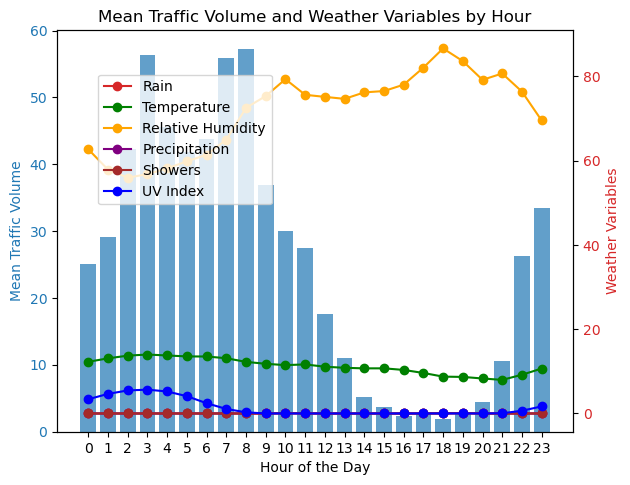

In [32]:
# Convert 'timestamp' column to datetime format
merged_data['timestamp'] = pd.to_datetime(merged_data['timestamp'])

# Extract hour from timestamp
merged_data['hour'] = merged_data['timestamp'].dt.hour

# Group data by hour and calculate mean traffic volume and mean weather variables
hourly_data = merged_data.groupby('hour').agg({
    'total_of_directions': 'mean', 
    'rain': 'mean', 
    'temperature_2m': 'mean', 
    'relative_humidity_2m': 'mean', 
    'precipitation': 'mean', 
    'showers': 'mean', 
    'uv_index': 'mean'
})

# Plot bar chart
fig, ax1 = plt.subplots()

# Bar for traffic volume
color = 'tab:blue'
ax1.set_xlabel('Hour of the Day')
ax1.set_ylabel('Mean Traffic Volume', color=color)
ax1.bar(hourly_data.index, hourly_data['total_of_directions'], color=color, alpha=0.7)
ax1.tick_params(axis='y', labelcolor=color)

# Create another y-axis for weather variables
ax2 = ax1.twinx()  

# Line plot for rain
color = 'tab:red'
ax2.set_ylabel('Weather Variables', color=color)
ax2.plot(hourly_data.index, hourly_data['rain'], color=color, linestyle='-', marker='o', label='Rain')
ax2.plot(hourly_data.index, hourly_data['temperature_2m'], color='green', linestyle='-', marker='o', label='Temperature')
ax2.plot(hourly_data.index, hourly_data['relative_humidity_2m'], color='orange', linestyle='-', marker='o', label='Relative Humidity')
ax2.plot(hourly_data.index, hourly_data['precipitation'], color='purple', linestyle='-', marker='o', label='Precipitation')
ax2.plot(hourly_data.index, hourly_data['showers'], color='brown', linestyle='-', marker='o', label='Showers')
ax2.plot(hourly_data.index, hourly_data['uv_index'], color='blue', linestyle='-', marker='o', label='UV Index')
ax2.tick_params(axis='y', labelcolor=color)

# Add legend
fig.tight_layout()
fig.legend(loc="upper left", bbox_to_anchor=(0.15,0.88))

# Show plot
plt.title(f'Mean Traffic Volume and Weather Variables by Hour')
plt.xticks(range(24))
plt.show()


<div id="subsection-7-2" class="usecase-sub-section-heading"><b>7.2. Distribution of hourly weather variables</b></div>

<div class="usecase-body">Each weather variable's hourly mean is plotted as a histogram in a grid, showing how consistently each weather condition tends to occur throughout the day.</div>

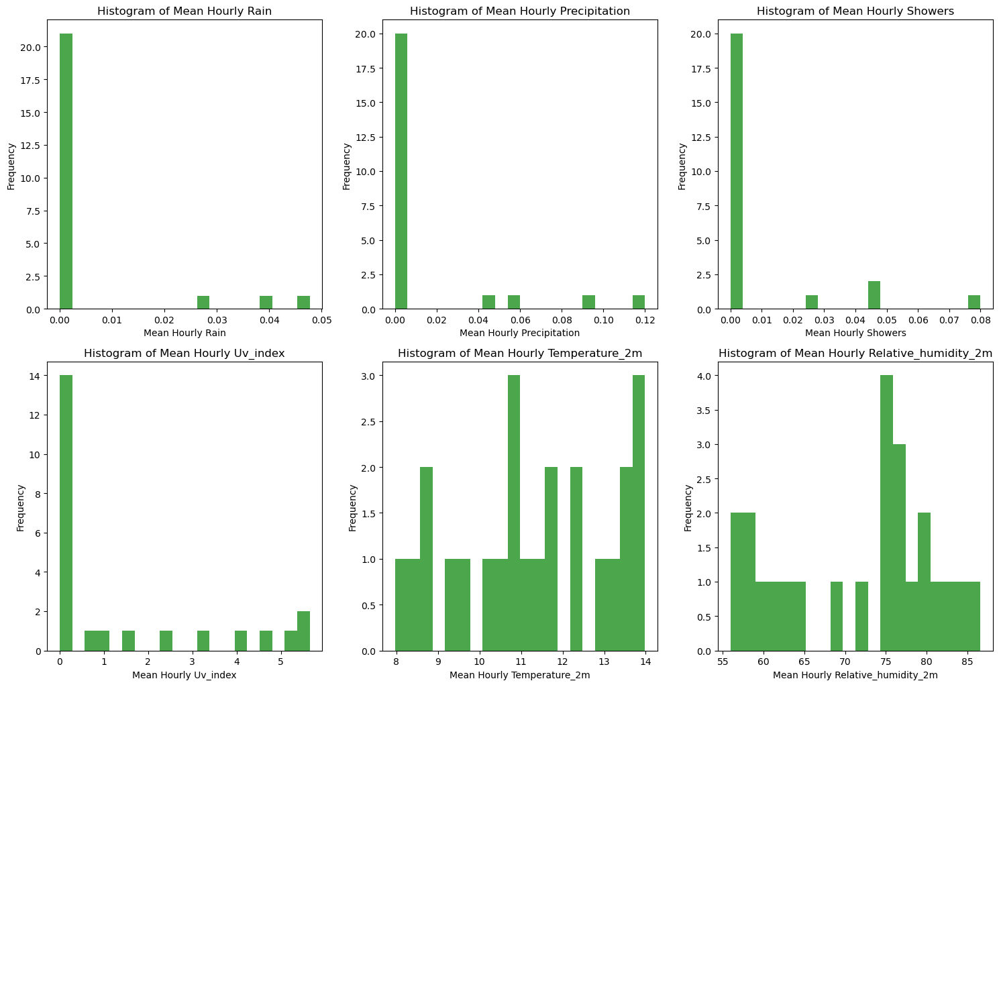

In [33]:
# Extract hour from timestamp
merged_data['hour'] = merged_data['timestamp'].dt.hour

# Define precipitation measures
precipitation_measures = ['rain', 'precipitation', 'showers','uv_index','temperature_2m','relative_humidity_2m'] 

# Create subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate over precipitation measures
for i, measure in enumerate(precipitation_measures):
    # Group data by hour and calculate mean for the current precipitation measure
    hourly_data = merged_data.groupby('hour')[measure].mean()
    
    # Plot histogram of mean hourly precipitation
    axes[i].hist(hourly_data, bins=20, color='green', alpha=0.7)
    axes[i].set_xlabel(f'Mean Hourly {measure.capitalize()}')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Histogram of Mean Hourly {measure.capitalize()}')

# Hide empty subplots (if any)
for ax in axes[len(precipitation_measures):]:
    ax.axis('off')

plt.tight_layout()
plt.show()


<div id="subsection-7-3" class="usecase-sub-section-heading"><b>7.3. Traffic volume against individual weather variables</b></div>

<div class="usecase-body">Each weather variable is plotted against pedestrian traffic volume as a scatter plot with a fitted trend line, giving a direct visual read on the strength and direction of the relationship between each weather variable and pedestrian activity.</div>

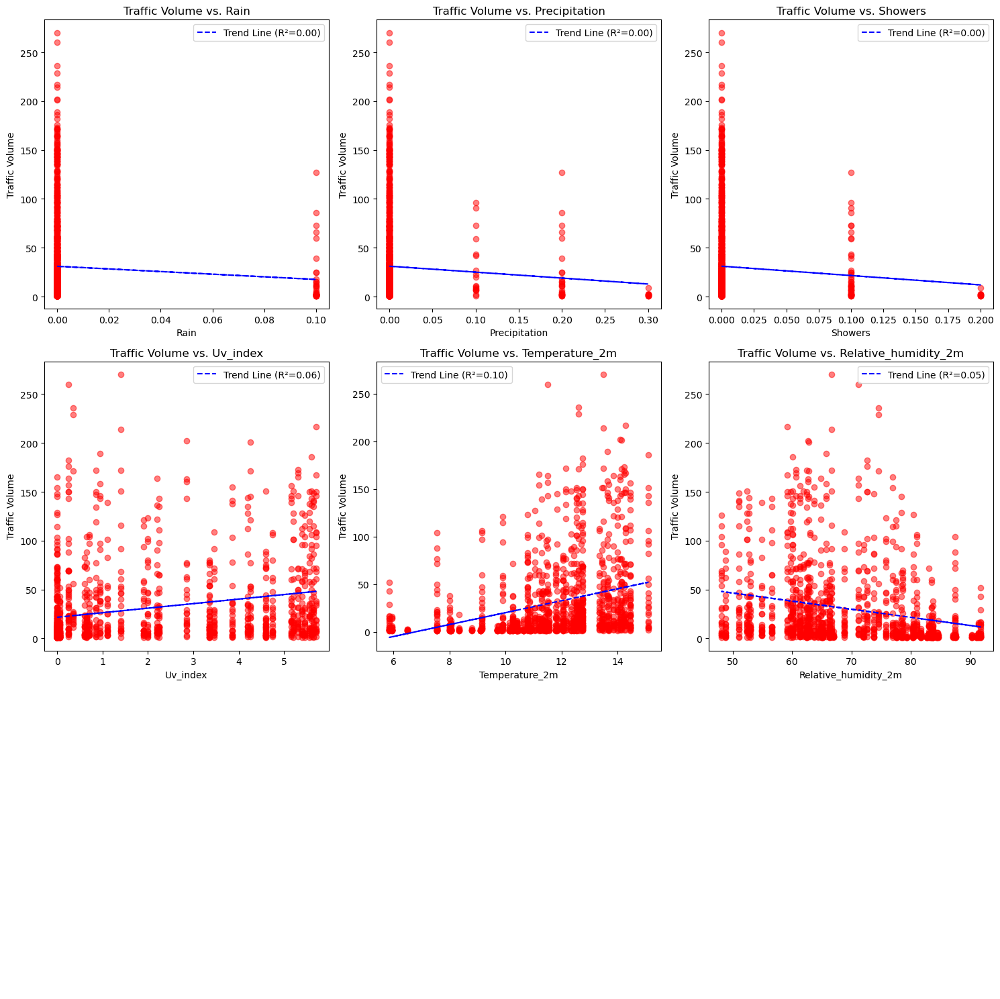

In [34]:
# Define function to calculate regression line
def plot_trend_line(x, y, ax):
    if len(np.unique(x)) > 1:
        slope, intercept, r_value, p_value, std_err = linregress(x, y)
        line = slope * x + intercept
        ax.plot(x, line, color='blue', linestyle='--', label=f'Trend Line (R²={r_value**2:.2f})')
        ax.legend()
    else:
        ax.text(0.5, 0.5, 'Insufficient variation in data for regression', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, color='red')

# Create subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate over precipitation measures
for i, measure in enumerate(precipitation_measures):
    # Scatter plot of traffic volume vs. the current precipitation measure
    axes[i].scatter(merged_data[measure], merged_data['total_of_directions'], color='red', alpha=0.5)
    axes[i].set_xlabel(measure.capitalize())  # Set x-axis label
    axes[i].set_ylabel('Traffic Volume')  # Set y-axis label
    axes[i].set_title(f'Traffic Volume vs. {measure.capitalize()}')  # Set title
    
    # Calculate and plot trend line
    plot_trend_line(merged_data[measure], merged_data['total_of_directions'], axes[i])

# Hide empty subplots (if any)
for ax in axes[len(precipitation_measures):]:
    ax.axis('off')

plt.tight_layout()
plt.show()


<div id="section-8" class="usecase-section-heading"><b>8. Preparing data for regression modelling</b></div>

<div class="usecase-body">This section transforms the cleaned dataset into a form suitable for regression modelling, scaling numeric features and converting categorical columns into a numeric representation.</div>

<div id="subsection-8-1" class="usecase-sub-section-heading"><b>8.1. Normalise numeric features</b></div>

<div class="usecase-body">A copy of the cleaned dataset is made and normalised using min-max scaling, so pedestrian traffic and each weather variable are all placed on a comparable 0 to 1 scale before modelling.</div>

In [35]:
normalized_data = merged_data.copy()

In [36]:
# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# List of columns to normalize
columns_to_normalize = ['total_of_directions', 'temperature_2m', 'relative_humidity_2m',
                        'precipitation', 'rain', 'showers', 'weather_code', 'uv_index']

# Fit the scaler on the data and transform it, keeping the DataFrame structure
normalized_data[columns_to_normalize] = scaler.fit_transform(normalized_data[columns_to_normalize])

# Print the scaled DataFrame
print(normalized_data)

       latitude   longitude                 timestamp  temperature_2m  \
54   -37.818742  144.967877 2026-09-07 14:00:00+00:00        0.491892   
55   -37.818742  144.967877 2026-09-07 15:00:00+00:00        0.464865   
56   -37.818742  144.967877 2026-09-07 16:00:00+00:00        0.416216   
57   -37.818742  144.967877 2026-09-07 17:00:00+00:00        0.318919   
58   -37.818742  144.967877 2026-09-07 18:00:00+00:00        0.183784   
...         ...         ...                       ...             ...   
4303 -37.808967  144.949317 2026-09-10 04:00:00+00:00        0.908108   
4304 -37.808967  144.949317 2026-09-10 05:00:00+00:00        0.897297   
4305 -37.808967  144.949317 2026-09-10 06:00:00+00:00        0.891892   
4306 -37.808967  144.949317 2026-09-10 07:00:00+00:00        0.827027   
4307 -37.808967  144.949317 2026-09-10 08:00:00+00:00        0.729730   

      relative_humidity_2m  precipitation  rain  showers  weather_code  \
54                0.770157            0.0   0.0  

<div id="subsection-8-2" class="usecase-sub-section-heading"><b>8.2. Check unique direction values</b></div>

<div class="usecase-body">Before encoding the direction columns, their unique values are checked to understand exactly what categories are present in the pedestrian sensor data.</div>

In [37]:
unique_values = normalized_data['direction_1_y'].unique()
print(unique_values)
unique_values2 = normalized_data['direction_2_y'].unique()
print(unique_values2)

['North' 'East']
['South' 'West']


In [38]:
# Display the data types of all columns
print(normalized_data.dtypes)

latitude                            float64
longitude                           float64
timestamp               datetime64[ns, UTC]
temperature_2m                      float64
relative_humidity_2m                float64
precipitation                       float64
rain                                float64
showers                             float64
weather_code                        float64
uv_index                            float64
location_id                           int64
sensing_date                         object
sensing_time                         object
direction_1_x                         int64
direction_2_x                         int64
total_of_directions                 float64
sensor_description                   object
sensor_name                          object
installation_date                    object
note                                 object
location_type                        object
status                               object
direction_1_y                   

<div id="subsection-8-3" class="usecase-sub-section-heading"><b>8.3. One-hot encode direction features</b></div>

<div class="usecase-body">The two direction columns are categorical, so they are one-hot encoded into binary columns using scikit-learn's OneHotEncoder, making them usable as inputs to a regression model.</div>

In [39]:
from sklearn.preprocessing import OneHotEncoder

In [40]:
# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)  # sparse=False ensures output is a numpy array

# Check if columns exist to avoid KeyError
if {'direction_1_y', 'direction_2_y'}.issubset(merged_data.columns):
    # Fit and transform the data
    encoded_data = encoder.fit_transform(normalized_data[['direction_1_y', 'direction_2_y']])
    
    # Get the feature names from the encoder
    encoded_feature_names = encoder.get_feature_names_out(['direction_1_y', 'direction_2_y'])
    
    # Create a DataFrame with the encoded data and the generated feature names
    encoded_df = pd.DataFrame(encoded_data, columns=encoded_feature_names)
    
    # Concatenate the encoded data back to the original DataFrame
    normalized_data = pd.concat([normalized_data.drop(['direction_1_y', 'direction_2_y'], axis=1), encoded_df], axis=1)
    print(normalized_data.head())
else:
    print("Columns 'direction_1_y' or 'direction_2_y' are not found in the DataFrame.")


     latitude   longitude                 timestamp  temperature_2m  \
54 -37.818742  144.967877 2026-09-07 14:00:00+00:00        0.491892   
55 -37.818742  144.967877 2026-09-07 15:00:00+00:00        0.464865   
56 -37.818742  144.967877 2026-09-07 16:00:00+00:00        0.416216   
57 -37.818742  144.967877 2026-09-07 17:00:00+00:00        0.318919   
58 -37.818742  144.967877 2026-09-07 18:00:00+00:00        0.183784   

    relative_humidity_2m  precipitation  rain  showers  weather_code  \
54              0.770157            0.0   0.0      0.0      0.039216   
55              0.808246            0.0   0.0      0.0      0.058824   
56              0.833363            0.0   0.0      0.0      0.039216   
57              0.905628            0.0   0.0      0.0      0.039216   
58              0.966445            0.0   0.0      0.0      0.000000   

    uv_index  ...                             note location_type status  \
54       0.0  ...  Replace with: 00:6e:02:01:9e:54       Outdoor 

<div id="section-9" class="usecase-section-heading"><b>9. Correlation and multicollinearity checks</b></div>

<div class="usecase-body">Before fitting a regression model, this section checks how strongly the weather variables relate to pedestrian traffic, and whether any of those weather variables are too closely correlated with each other to use together.</div>

<div id="subsection-9-1" class="usecase-sub-section-heading"><b>9.1. Correlation between weather features and traffic volume</b></div>

<div class="usecase-body">A correlation matrix is calculated across temperature, humidity, precipitation, showers, UV index and pedestrian traffic volume, then visualised as a heatmap to make the strongest relationships easy to spot.</div>

In [41]:
selected_columns = ['temperature_2m', 'relative_humidity_2m', 'precipitation', 'showers', 'uv_index','total_of_directions']  
correlation_matrix = normalized_data[selected_columns].corr()

# Display the correlation matrix
correlation_matrix

,temperature_2m,relative_humidity_2m,precipitation,showers,uv_index,total_of_directions
temperature_2m,1.000000,-0.754254,-0.081396,-0.076706,0.680003,0.310627
relative_humidity_2m,-0.754254,1.000000,0.171243,0.155731,-0.727733,-0.226316
precipitation,-0.081396,0.171243,1.000000,0.973146,-0.179091,-0.058553
showers,-0.076706,0.155731,0.973146,1.000000,-0.182045,-0.057701
uv_index,0.680003,-0.727733,-0.179091,-0.182045,1.000000,0.237441
total_of_directions,0.310627,-0.226316,-0.058553,-0.057701,0.237441,1.000000


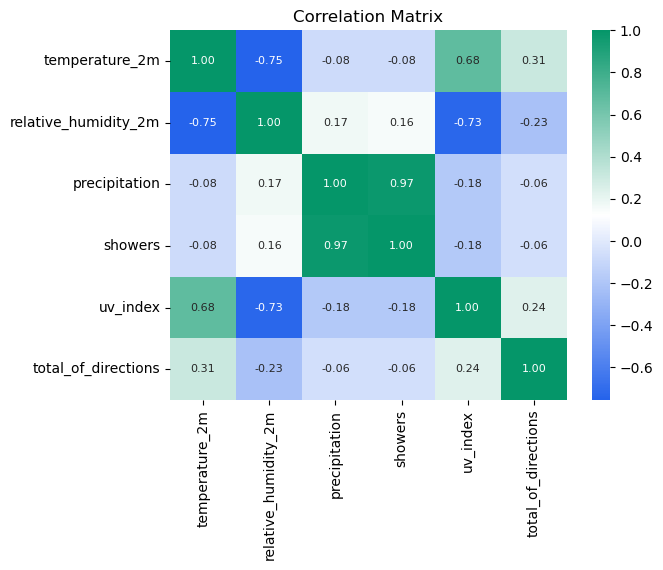

In [42]:
# plt.figure(figsize=(10, 8))
# Template palette diverging scale: distinct blue (negative) -> white (zero) -> primary green (positive)
mop_diverging = LinearSegmentedColormap.from_list('mop_diverging', ['#2563EB', '#FFFFFF', '#059669'])

sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap=mop_diverging,annot_kws={"size": 8})
plt.title('Correlation Matrix')
plt.show()

<div id="subsection-9-2" class="usecase-sub-section-heading"><b>9.2. Variance Inflation Factor check</b></div>

<div class="usecase-body">The Variance Inflation Factor (VIF) is calculated for each weather predictor. A high VIF (typically above 5 or 10) indicates a predictor is highly collinear with the others, which can make a regression model's coefficients unreliable if left unaddressed.</div>

In [43]:
predictors = normalized_data[['temperature_2m',  'uv_index', 'showers', 'rain','relative_humidity_2m']]
# Add a constant term for intercept
predictors = predictors.replace([np.inf, -np.inf], np.nan).dropna()
predictors = sm.add_constant(predictors)

# Calculating VIF for each variable
vif_data = pd.DataFrame()
vif_data["feature"] = predictors.columns

vif_data["VIF"] = [variance_inflation_factor(predictors.values, i)
                   for i in range(len(predictors.columns))]

print(vif_data)


                feature        VIF
0                 const  47.048854
1        temperature_2m   2.561366
2              uv_index   2.369665
3               showers   3.314090
4                  rain   3.310670
5  relative_humidity_2m   2.954924


<div id="section-10" class="usecase-section-heading"><b>10. Predicting pedestrian traffic from weather</b></div>

<div class="usecase-body">With the predictors checked for multicollinearity, a first regression model is fitted using only weather features, to establish a baseline for how much of pedestrian traffic weather alone can explain.</div>

<div id="subsection-10-1" class="usecase-sub-section-heading"><b>10.1. Regression model using climate features only</b></div>

<div class="usecase-body">An Ordinary Least Squares regression model is fitted on temperature, UV index, showers and rain, using a train/test split. The model summary reports each predictor's coefficient and statistical significance, along with the AIC and BIC model selection criteria.</div>

In [44]:

def perform_regression(df):
    
    X = df[['temperature_2m',  'uv_index', 'showers', 'rain']]
    y = df['total_of_directions']

    X = X.replace([np.inf, -np.inf], np.nan).fillna(X.mean())
    y = y.replace([np.inf, -np.inf], np.nan).fillna(y.mean())

    # Splitting the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Adding a constant to the model for the intercept
    X_train_with_const = sm.add_constant(X_train)
    X_test_with_const = sm.add_constant(X_test)
    
    # Creating an OLS model with statsmodels
    model = sm.OLS(y_train, X_train_with_const).fit()
    
    # Output the summary of the model
    print(model.summary())
    
    print(f'AIC: {model.aic}')
    print(f'BIC: {model.bic}')


perform_regression(normalized_data)



                             OLS Regression Results                            
Dep. Variable:     total_of_directions   R-squared:                       0.095
Model:                             OLS   Adj. R-squared:                  0.093
Method:                  Least Squares   F-statistic:                     43.20
Date:                 Wed, 16 Sep 2026   Prob (F-statistic):           1.69e-34
Time:                         05:38:07   Log-Likelihood:                 1200.6
No. Observations:                 1642   AIC:                            -2391.
Df Residuals:                     1637   BIC:                            -2364.
Df Model:                            4                                         
Covariance Type:             nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.0125      0.0

<div id="section-11" class="usecase-section-heading"><b>11. Adding location to the traffic model</b></div>

<div class="usecase-body">Weather alone is unlikely to fully explain pedestrian traffic, since some locations are simply busier than others regardless of conditions. This section adds sensor location into the model as an additional feature.</div>

<div id="subsection-11-1" class="usecase-sub-section-heading"><b>11.1. One-hot encode sensor location</b></div>

<div class="usecase-body">The categorical <code>location_id</code> column is converted into a set of binary dummy variables using <code>pd.get_dummies</code>, so each sensor location can be included as a numeric feature in the model.</div>

In [45]:
location_dummies = pd.get_dummies(normalized_data['location_id'], prefix='location')
merged_data_encoded = pd.concat([normalized_data, location_dummies], axis=1)
merged_data_encoded.columns

Index(['latitude', 'longitude', 'timestamp', 'temperature_2m',
       'relative_humidity_2m', 'precipitation', 'rain', 'showers',
       'weather_code', 'uv_index', 'location_id', 'sensing_date',
       'sensing_time', 'direction_1_x', 'direction_2_x', 'total_of_directions',
       'sensor_description', 'sensor_name', 'installation_date', 'note',
       'location_type', 'status', 'location', 'date_only', 'hour',
       'direction_1_y_East', 'direction_1_y_North', 'direction_2_y_South',
       'direction_2_y_West', 'location_5.0', 'location_6.0', 'location_11.0',
       'location_17.0', 'location_19.0', 'location_20.0', 'location_23.0',
       'location_29.0', 'location_30.0', 'location_35.0', 'location_36.0',
       'location_37.0', 'location_39.0', 'location_40.0', 'location_44.0',
       'location_45.0', 'location_47.0', 'location_51.0', 'location_77.0',
       'location_84.0', 'location_123.0', 'location_166.0', 'location_181.0',
       'location_209.0'],
      dtype='object')

<div id="subsection-11-2" class="usecase-sub-section-heading"><b>11.2. Correlation matrix including location</b></div>

<div class="usecase-body">With location now included as a numeric feature, a wider correlation matrix is calculated across the remaining numeric columns, to check whether adding location introduces any strong new correlations worth being aware of before modelling.</div>

In [46]:
selected_data = merged_data_encoded.drop([ 'timestamp','longitude','latitude','direction_1_x',
       'direction_2_x', 'total_of_directions'], axis=1)
# Display columns with their data types
selected_data = selected_data.select_dtypes(include=[np.number])

#selected_columns = ['temperature_2m', 'relative_humidity_2m', 'precipitation', 'rain', 'showers', 'uv_index']  
correlation_matrix3 = selected_data.corr()
#correlation_matrix = selected_data.corr()
# Display the correlation matrix
correlation_matrix3


,temperature_2m,relative_humidity_2m,precipitation,rain,showers,weather_code,uv_index,location_id,hour,direction_1_y_East,direction_1_y_North,direction_2_y_South,direction_2_y_West
temperature_2m,1.000000,-0.754254,-0.081396,-0.080111,-0.076706,-0.032989,0.680003,-0.001570,-0.802150,0.051985,-0.051985,-0.051985,0.051985
relative_humidity_2m,-0.754254,1.000000,0.171243,0.177053,0.155731,0.133526,-0.727733,-0.001661,0.642995,-0.065596,0.065596,0.065596,-0.065596
precipitation,-0.081396,0.171243,1.000000,0.937831,0.973146,0.925975,-0.179091,-0.013538,0.091488,-0.003624,0.003624,0.003624,-0.003624
rain,-0.080111,0.177053,0.937831,1.000000,0.832750,0.807885,-0.156251,-0.016605,0.079004,-0.010045,0.010045,0.010045,-0.010045
showers,-0.076706,0.155731,0.973146,0.832750,1.000000,0.941248,-0.182045,-0.010583,0.093537,0.000921,-0.000921,-0.000921,0.000921
weather_code,-0.032989,0.133526,0.925975,0.807885,0.941248,1.000000,-0.189330,-0.008987,0.032513,0.006573,-0.006573,-0.006573,0.006573
uv_index,0.680003,-0.727733,-0.179091,-0.156251,-0.182045,-0.189330,1.000000,0.000678,-0.721164,0.035213,-0.035213,-0.035213,0.035213
location_id,-0.001570,-0.001661,-0.013538,-0.016605,-0.010583,-0.008987,0.000678,1.000000,-0.000074,-0.400069,0.400069,0.400069,-0.400069
hour,-0.802150,0.642995,0.091488,0.079004,0.093537,0.032513,-0.721164,-0.000074,1.000000,-0.030818,0.030818,0.030818,-0.030818
direction_1_y_East,0.051985,-0.065596,-0.003624,-0.010045,0.000921,0.006573,0.035213,-0.400069,-0.030818,1.000000,-1.000000,-1.000000,1.000000


In [47]:
string_columns = merged_data_encoded.select_dtypes(include=['object']).columns
string_columns

Index(['sensing_date', 'sensing_time', 'sensor_description', 'sensor_name',
       'installation_date', 'note', 'location_type', 'status', 'location',
       'date_only'],
      dtype='object')

In [48]:
merged_data_encoded

,latitude,longitude,timestamp,temperature_2m,relative_humidity_2m,precipitation,rain,showers,weather_code,uv_index,...,location_44.0,location_45.0,location_47.0,location_51.0,location_77.0,location_84.0,location_123.0,location_166.0,location_181.0,location_209.0
54,-37.818742,144.967877,2026-09-07 14:00:00+00:00,0.491892,0.770157,0.0,0.0,0.0,0.039216,0.0,...,False,False,False,False,False,False,False,False,False,False
55,-37.818742,144.967877,2026-09-07 15:00:00+00:00,0.464865,0.808246,0.0,0.0,0.0,0.058824,0.0,...,False,False,False,False,False,False,False,False,False,False
56,-37.818742,144.967877,2026-09-07 16:00:00+00:00,0.416216,0.833363,0.0,0.0,0.0,0.039216,0.0,...,False,False,False,False,False,False,False,False,False,False
57,-37.818742,144.967877,2026-09-07 17:00:00+00:00,0.318919,0.905628,0.0,0.0,0.0,0.039216,0.0,...,False,False,False,False,False,False,False,False,False,False
58,-37.818742,144.967877,2026-09-07 18:00:00+00:00,0.183784,0.966445,0.0,0.0,0.0,0.000000,0.0,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1236,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False
1237,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False
1238,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False
1239,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False


<div id="subsection-11-3" class="usecase-sub-section-heading"><b>11.3. Regression model using weather and location features</b></div>

<div class="usecase-body">A second regression model is fitted, this time including sensor location alongside the weather features, and evaluated using Mean Squared Error and R² on a held-out test set.</div>

In [49]:
def perform_regression(df):
    # Selecting the target variable and features
    #X = df[['temperature_2m', 'relative_humidity_2m', 'uv_index','showers','rain']]  
    # Mean Squared Error: 0.005115399601514251
    # R^2 Score: 0.1291088971360574

    df = df.dropna()  # Drops rows with any NaN values
    X = df.drop([ 'longitude', 'latitude', 'direction_1_x', 'direction_2_x', 'total_of_directions'], axis=1)
    y = df['total_of_directions']
    X = X.select_dtypes(include=[np.number])
    # Splitting the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    #  Creating a linear regression model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Making predictions
    y_pred = model.predict(X_test)

    # Evaluating the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Mean Squared Error: {mse}")
    print(f"R^2 Score: {r2}")
    
# Call the function with  DataFrame
perform_regression(merged_data_encoded)  # Adjust parameters as needed based on the correlation results


Mean Squared Error: 0.023118222070484293
R^2 Score: 0.15188751323590788


<div class="usecase-body">On this run, the regression model achieved a Mean Squared Error of approximately 0.023 and an R² score of about 0.15, meaning weather and location together explain roughly 15% of the variation in pedestrian traffic volume — a fairly weak result on its own. It is worth being explicit that this figure is a snapshot, not a fixed benchmark: because Section 3.4 always filters to “the last month” relative to whenever the notebook is run, the exact traffic and weather data feeding the model changes every time it is re-run, and the MSE and R² above will change with it. The dataset's original author reported a noticeably stronger R² of about 0.52 on a different run window, which shows just how much this model's apparent performance depends on which month's data it happens to be trained and tested on, rather than on the model itself changing.</div>

<div id="section-12" class="usecase-section-heading"><b>12. Footpath steepness and safe route mapping</b></div>

<div class="usecase-body">The regression analysis above looks at pedestrian traffic city-wide. This section turns to the second question in the Scenario — identifying steep footpaths and using that to inform safer route choices — using the footpath steepness dataset directly, rather than the aggregated traffic model.</div>

<div id="subsection-12-1" class="usecase-sub-section-heading"><b>12.1. Embedded City of Melbourne footpath steepness map</b></div>

<div class="usecase-body">The City of Melbourne's own footpath steepness map is embedded directly via an iframe, giving an immediate visual reference point before working with the raw data.</div>

In [50]:
# Define the HTML code for the map
html_code = """
<iframe src="https://data.melbourne.vic.gov.au/explore/embed/dataset/footpath-steepness/map/?location=16,-37.81284,144.95249&basemap=mbs-7a7333" width="1100" height="600" frameborder="0"></iframe>
"""

# Display the map in the notebook
HTML(html_code)


<div id="subsection-12-2" class="usecase-sub-section-heading"><b>12.2. Inspect the footpath steepness dataset</b></div>

<div class="usecase-body">The column types and a preview of the footpath steepness data retrieved in Section 2.1 are checked here before it is used for mapping.</div>

In [51]:
print(footpath_steepness.dtypes)

geo_point_2d     object
geo_shape        object
grade1in        float64
gradepc         float64
segside          object
statusid        float64
asset_type       object
deltaz          float64
streetid        float64
mccid_int       float64
mcc_id            int64
address          object
rlmax           float64
rlmin           float64
distance        float64
dtype: object


In [52]:
footpath_steepness.head()

,geo_point_2d,geo_shape,grade1in,gradepc,segside,statusid,asset_type,deltaz,streetid,mccid_int,mcc_id,address,rlmax,rlmin,distance
0,"-37.82248421984372, 144.94698696781802","{""coordinates"": [[[[144.9469802038297, -37.822...",27.2,3.68,NaN,6.0,Road Footway,1.20,120090.0,23302.0,1434263,Australian Wharf between Webb Bridge and Colli...,3.62,2.42,32.65
1,"-37.821630702960945, 144.9445494642227","{""coordinates"": [[[[144.94443806541557, -37.82...",81.9,1.22,South,2.0,Road Footway,0.80,526.0,22956.0,1513773,Collins Street between Navigation Drive and Me...,2.97,2.17,65.54
2,"-37.83720010090614, 144.97830017049233","{""coordinates"": [[[[144.97829868381356, -37.83...",28.6,3.50,NaN,NaN,Road Footway,1.42,NaN,NaN,1383794,NaN,15.22,13.80,40.61
3,"-37.79266655274917, 144.96814552402157","{""coordinates"": [[[[144.9681459377619, -37.792...",66.0,1.52,NaN,NaN,Road Footway,1.58,NaN,NaN,1384171,NaN,40.87,39.29,104.22
4,"-37.79346103680766, 144.9665078780391","{""coordinates"": [[[[144.96650880279236, -37.79...",44.8,2.23,NaN,2.0,Road Footway,1.41,0.0,20520.0,1556146,Intersection of Cardigan Street and Lytton Street,46.68,45.27,63.23


<div id="subsection-12-3" class="usecase-sub-section-heading"><b>12.3. Import footpath steepness as GeoJSON</b></div>

<div class="usecase-body">For spatial mapping, footpath steepness is loaded separately from a local GeoJSON file into a GeoDataFrame using GeoPandas, which preserves the actual footpath geometry rather than just point coordinates.</div>

                                            geometry  \
0  MULTIPOLYGON (((144.94698 -37.82248, 144.94696...   
1  MULTIPOLYGON (((144.94444 -37.82162, 144.94444...   
2  MULTIPOLYGON (((144.9783 -37.83721, 144.9783 -...   
3  MULTIPOLYGON (((144.96815 -37.79267, 144.96814...   
4  MULTIPOLYGON (((144.96651 -37.79346, 144.96651...   

                                        geo_point_2d  grade1in  gradepc  \
0  {'lon': 144.94698696781802, 'lat': -37.8224842...      27.2     3.68   
1  {'lon': 144.9445494642227, 'lat': -37.82163070...      81.9     1.22   
2  {'lon': 144.97830017049233, 'lat': -37.8372001...      28.6     3.50   
3  {'lon': 144.96814552402157, 'lat': -37.7926665...      66.0     1.52   
4  {'lon': 144.9665078780391, 'lat': -37.79346103...      44.8     2.23   

  segside statusid    asset_type  deltaz  streetid  mccid_int   mcc_id  \
0    None        6  Road Footway    1.20  120090.0    23302.0  1434263   
1   South        2  Road Footway    0.80     526.0    22956.0  1

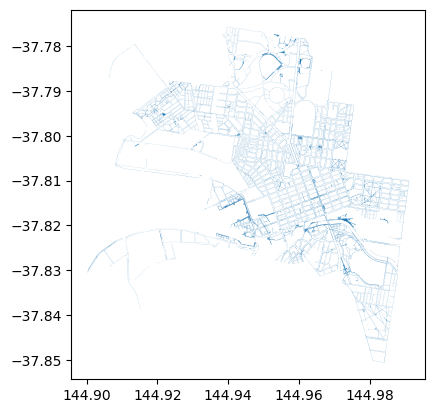

In [53]:
# Load the footpath steepness GeoJSON via the API, since the local .geojson file
# is not committed to this repository's dependency folder.
# GeoJSON from the API has no CRS attached by default - it's WGS84 (EPSG:4326) per the
# GeoJSON spec, so this is set explicitly rather than left implicit. Without this, any
# later .to_crs() call fails with "Cannot transform naive geometries."
geojson_url = 'https://melbournetestbed.opendatasoft.com/api/explore/v2.1/catalog/datasets/footpath-steepness/exports/geojson'
params = {'lang': 'en', 'timezone': 'UTC', 'api_key': api_key}

response = requests.get(geojson_url, params = params)
if response.status_code == 200:
    gdf = gpd.GeoDataFrame.from_features(response.json()['features'])
    gdf = gdf.set_crs(epsg = 4326)
else:
    print(f'Request failed with status code {response.status_code}')

# Check the first few records to understand what the data looks like
print(gdf.head())

# Perform a quick plot to visualise
gdf.plot()

# Show the plot
plt.show()

<div id="subsection-12-4" class="usecase-sub-section-heading"><b>12.4. Clean the footpath steepness data</b></div>

<div class="usecase-body">Rows where all the key steepness measures — grade, elevation change and distance — are missing are removed, so only footpaths with at least some usable steepness data are kept for mapping.</div>

In [54]:
# Specify the columns to focus on for cleaning
columns_of_interest = ['grade1in', 'gradepc', 'deltaz', 'rlmax', 'rlmin', 'distance']

# Remove rows where all specified columns have missing values
gdf_cleaned = gdf.dropna(subset=columns_of_interest, how='all')

# Display the first few records of the cleaned GeoDataFrame to verify
print(gdf_cleaned.head())


                                            geometry  \
0  MULTIPOLYGON (((144.94698 -37.82248, 144.94696...   
1  MULTIPOLYGON (((144.94444 -37.82162, 144.94444...   
2  MULTIPOLYGON (((144.9783 -37.83721, 144.9783 -...   
3  MULTIPOLYGON (((144.96815 -37.79267, 144.96814...   
4  MULTIPOLYGON (((144.96651 -37.79346, 144.96651...   

                                        geo_point_2d  grade1in  gradepc  \
0  {'lon': 144.94698696781802, 'lat': -37.8224842...      27.2     3.68   
1  {'lon': 144.9445494642227, 'lat': -37.82163070...      81.9     1.22   
2  {'lon': 144.97830017049233, 'lat': -37.8372001...      28.6     3.50   
3  {'lon': 144.96814552402157, 'lat': -37.7926665...      66.0     1.52   
4  {'lon': 144.9665078780391, 'lat': -37.79346103...      44.8     2.23   

  segside statusid    asset_type  deltaz  streetid  mccid_int   mcc_id  \
0    None        6  Road Footway    1.20  120090.0    23302.0  1434263   
1   South        2  Road Footway    0.80     526.0    22956.0  1

<div id="subsection-12-5" class="usecase-sub-section-heading"><b>12.5. Check for missing values</b></div>

<div class="usecase-body">Descriptive statistics and a missing value count on the grade columns confirm how complete the cleaned footpath data actually is before it is mapped.</div>

In [55]:

descriptive_stats = gdf_cleaned[['grade1in', 'gradepc']].describe()

# Identifying missing values
missing_values = gdf_cleaned[['grade1in', 'gradepc']].isnull().sum()

# Outputting the results
print(descriptive_stats)
print('-----------------')
print(missing_values)


            grade1in       gradepc
count   26287.000000  29129.000000
mean      304.577167      3.915023
std      5204.290952     13.849314
min         0.200000      0.000000
25%        23.500000      0.890000
50%        42.200000      2.100000
75%        83.300000      4.000000
max    288931.500000    580.470000
-----------------
grade1in    2842
gradepc        0
dtype: int64


In [56]:
print(gdf_cleaned.dtypes)

geometry        geometry
geo_point_2d      object
grade1in         float64
gradepc          float64
segside           object
statusid          object
asset_type        object
deltaz           float64
streetid         float64
mccid_int        float64
mcc_id             int64
address           object
rlmax            float64
rlmin            float64
distance         float64
geo_shape        float64
dtype: object


In [57]:
gdf_cleaned = gdf_cleaned.dropna(subset=['streetid'])
gdf_cleaned.head()

,geometry,geo_point_2d,grade1in,gradepc,segside,statusid,asset_type,deltaz,streetid,mccid_int,mcc_id,address,rlmax,rlmin,distance,geo_shape
0,"MULTIPOLYGON (((144.94698 -37.82248, 144.94696...","{'lon': 144.94698696781802, 'lat': -37.8224842...",27.2,3.68,None,6,Road Footway,1.20,120090.0,23302.0,1434263,Australian Wharf between Webb Bridge and Colli...,3.62,2.42,32.65,NaN
1,"MULTIPOLYGON (((144.94444 -37.82162, 144.94444...","{'lon': 144.9445494642227, 'lat': -37.82163070...",81.9,1.22,South,2,Road Footway,0.80,526.0,22956.0,1513773,Collins Street between Navigation Drive and Me...,2.97,2.17,65.54,NaN
4,"MULTIPOLYGON (((144.96651 -37.79346, 144.96651...","{'lon': 144.9665078780391, 'lat': -37.79346103...",44.8,2.23,None,2,Road Footway,1.41,0.0,20520.0,1556146,Intersection of Cardigan Street and Lytton Street,46.68,45.27,63.23,NaN
7,"MULTIPOLYGON (((144.95505 -37.80113, 144.95504...","{'lon': 144.955047400295, 'lat': -37.801128353...",31.4,3.18,West,2,Road Footway,0.42,446.0,21122.0,1386662,Blackwood Street between Flemington Road and C...,26.93,26.51,13.21,NaN
8,"MULTIPOLYGON (((144.97166 -37.80805, 144.97166...","{'lon': 144.97167267466202, 'lat': -37.8080370...",34.9,2.86,None,1,Road Footway,0.65,0.0,21598.0,1387791,Intersection of Victoria Street and La Trobe S...,33.96,33.31,22.70,NaN


In [58]:
gdf_cleaned = gdf_cleaned.dropna(subset=['address'])
gdf_cleaned

,geometry,geo_point_2d,grade1in,gradepc,segside,statusid,asset_type,deltaz,streetid,mccid_int,mcc_id,address,rlmax,rlmin,distance,geo_shape
0,"MULTIPOLYGON (((144.94698 -37.82248, 144.94696...","{'lon': 144.94698696781802, 'lat': -37.8224842...",27.2,3.68,None,6,Road Footway,1.20,120090.0,23302.0,1434263,Australian Wharf between Webb Bridge and Colli...,3.62,2.42,32.65,NaN
1,"MULTIPOLYGON (((144.94444 -37.82162, 144.94444...","{'lon': 144.9445494642227, 'lat': -37.82163070...",81.9,1.22,South,2,Road Footway,0.80,526.0,22956.0,1513773,Collins Street between Navigation Drive and Me...,2.97,2.17,65.54,NaN
4,"MULTIPOLYGON (((144.96651 -37.79346, 144.96651...","{'lon': 144.9665078780391, 'lat': -37.79346103...",44.8,2.23,None,2,Road Footway,1.41,0.0,20520.0,1556146,Intersection of Cardigan Street and Lytton Street,46.68,45.27,63.23,NaN
7,"MULTIPOLYGON (((144.95505 -37.80113, 144.95504...","{'lon': 144.955047400295, 'lat': -37.801128353...",31.4,3.18,West,2,Road Footway,0.42,446.0,21122.0,1386662,Blackwood Street between Flemington Road and C...,26.93,26.51,13.21,NaN
8,"MULTIPOLYGON (((144.97166 -37.80805, 144.97166...","{'lon': 144.97167267466202, 'lat': -37.8080370...",34.9,2.86,None,1,Road Footway,0.65,0.0,21598.0,1387791,Intersection of Victoria Street and La Trobe S...,33.96,33.31,22.70,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33577,"MULTIPOLYGON (((144.97116 -37.81307, 144.97116...","{'lon': 144.97117560070708, 'lat': -37.8130536...",36.5,2.74,None,2,Road Footway,0.64,0.0,20092.0,1387724,Intersection of Exhibition Street and Little C...,29.95,29.31,23.35,NaN
33578,"MULTIPOLYGON (((144.96986 -37.82353, 144.96991...","{'lon': 144.97019949460068, 'lat': -37.8242259...",133.5,0.75,West,1,Road Footway,1.19,1056.0,22466.0,1384095,St Kilda Road between Southbank Boulevard and ...,8.77,7.58,158.92,NaN
33580,None,"{'lon': 144.9406332872451, 'lat': -37.77673023...",70.4,1.42,None,2,Road Footway,2.43,119261.0,22923.0,1388253,Strickland Road between Parkville Avenue and P...,14.05,11.62,171.18,NaN
33581,"MULTIPOLYGON (((144.94223 -37.77601, 144.94223...","{'lon': 144.94221082841042, 'lat': -37.7759676...",13.2,7.58,None,2,Road Footway,0.81,962.0,22925.0,1388492,Park Street between Strickland Road and Parkvi...,19.45,18.64,10.68,NaN


In [59]:
gdf_cleaned.geometry

0        MULTIPOLYGON (((144.94698 -37.82248, 144.94696...
1        MULTIPOLYGON (((144.94444 -37.82162, 144.94444...
4        MULTIPOLYGON (((144.96651 -37.79346, 144.96651...
7        MULTIPOLYGON (((144.95505 -37.80113, 144.95504...
8        MULTIPOLYGON (((144.97166 -37.80805, 144.97166...
                               ...                        
33577    MULTIPOLYGON (((144.97116 -37.81307, 144.97116...
33578    MULTIPOLYGON (((144.96986 -37.82353, 144.96991...
33580                                                 None
33581    MULTIPOLYGON (((144.94223 -37.77601, 144.94223...
33582    MULTIPOLYGON (((144.95539 -37.78149, 144.95539...
Name: geometry, Length: 17587, dtype: geometry

<div id="subsection-12-6" class="usecase-sub-section-heading"><b>12.6. Map footpath steepness by elevation change</b></div>

<div class="usecase-body">Each footpath is coloured by its elevation change (<code>deltaz</code>), from blue for flat paths through to red for the steepest, with a tooltip showing the exact value on hover. This gives a direct visual answer to where the steepest, and therefore potentially more hazardous, footpaths are located.</div>

In [60]:
# Convert GeoDataFrame to the correct CRS for folium
gdf_cleaned = gdf_cleaned.to_crs(epsg=4326)

# This layer embeds every footpath polygon directly into the notebook output, which is
# what made an earlier version of this file too large for GitHub to render. Simplifying
# the geometry and rounding coordinates to 5 decimal places (about 1 metre - far finer
# than a footpath needs) cuts the embedded payload substantially with no visible
# difference on the map at city zoom levels.
gdf_map = gdf_cleaned.copy()
gdf_map['geometry'] = gdf_map.geometry.simplify(tolerance=0.00002, preserve_topology=True)
gdf_map['geometry'] = gdf_map.geometry.apply(
    lambda g: shapely_wkt.loads(shapely_wkt.dumps(g, rounding_precision=5))
)

# Create base map centered around Melbourne
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=16)

# Steepness bands using the template palette, anchored on the primary green for the
# flattest paths and ramping through to red for the steepest.
STEEPNESS_BANDS = [
    (20, '#B91C1C', 'Over 20 - very steep'),
    (15, '#EF4444', '15 to 20 - steep'),
    (10, '#F97316', '10 to 15 - moderately steep'),
    (5,  '#EAB308', '5 to 10 - slight slope'),
    (2,  '#2DBE6C', '2 to 5 - gentle slope'),
    (-999, '#059669', 'Under 2 - flat or nearly flat'),
]

# Function to style each polygon based on deltaz
def style_function(feature):
    deltaz = feature['properties']['deltaz']
    for threshold, colour, _ in STEEPNESS_BANDS:
        if deltaz > threshold:
            break
    return {
        'fillColor': colour,
        'color': colour,
        'weight': 0.5,
        'fillOpacity': 0.6,
    }

# Add the MULTIPOLYGON geometries to the map with tooltips showing deltaz
folium.GeoJson(
    gdf_map,
    name="Footpath Steepness",
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(fields=['deltaz'], aliases=['Delta Z:']),
).add_to(melbourne_map)

# Legend, built from the same bands used for styling so the two can't drift apart
legend_rows = ''.join(
    f'<i style="background:{colour}; width:10px; height:10px; display:inline-block;'
    f' border-radius:50%;"></i>&nbsp;{label}<br>'
    for _, colour, label in STEEPNESS_BANDS
)
legend_html = f"""
<div style="position: fixed;
            bottom: 40px; left: 40px; width: 250px;
            background-color: rgba(255, 255, 255, 0.9); border:2px solid grey; z-index:1000;
            font-size:13px; padding: 10px;">
<b>Footpath elevation change (Delta Z)</b><br><br>
{legend_rows}
</div>
"""
melbourne_map.get_root().html.add_child(folium.Element(legend_html))

# Add layer control to toggle layers
folium.LayerControl().add_to(melbourne_map)

# Display the map
melbourne_map

<div id="section-13" class="usecase-section-heading"><b>13. Selecting routes between streets</b></div>

<div class="usecase-body">To move from viewing steepness citywide to choosing a specific route, street name data is added so a start and end street can be selected directly.</div>

<div id="subsection-13-1" class="usecase-sub-section-heading"><b>13.1. Import street names as GeoJSON</b></div>

<div class="usecase-body">Street names are loaded from a local GeoJSON file into a GeoDataFrame, giving the actual street geometries needed to identify start and end points for a route.</div>

                                            geometry  \
0  LINESTRING (144.93892 -37.7754, 144.93907 -37....   
1  LINESTRING (144.95688 -37.84051, 144.95748 -37...   
2  LINESTRING (144.96262 -37.79884, 144.9627 -37....   
3  LINESTRING (144.99053 -37.81535, 144.99178 -37...   
4  LINESTRING (144.97398 -37.79497, 144.97385 -37...   

                                        geo_point_2d mccid_gis       maplabel  \
0  {'lon': 144.938994281833, 'lat': -37.774964845...        65           None   
1  {'lon': 144.9576332908824, 'lat': -37.84070441...        47           None   
2  {'lon': 144.9626580849035, 'lat': -37.79862453...         9  Porters  Lane   
3  {'lon': 144.9911535887165, 'lat': -37.81542826...       123           None   
4  {'lon': 144.9739120169235, 'lat': -37.79496297...       450         PH8027   

            name                    mccid_str     xdate  
0     GIBSON  AV  STREET_NAME_EXT_10000_Label  20160122  
1     MADDEN  ST  STREET_NAME_EXT_10000_Label  20160122  
2 

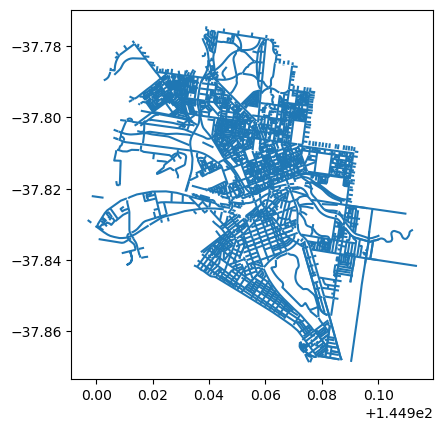

In [61]:
# Load the street names GeoJSON via the API, for the same reason as the footpath
# steepness dataset above - the local .geojson file is not in this repository.
# CRS is set explicitly for the same reason: GeoJSON is WGS84 by spec, but
# from_features() does not attach that automatically the way read_file() does.
geojson_url = 'https://melbournetestbed.opendatasoft.com/api/explore/v2.1/catalog/datasets/street-names/exports/geojson'
params = {'lang': 'en', 'timezone': 'UTC', 'api_key': api_key}

response = requests.get(geojson_url, params = params)
if response.status_code == 200:
    gdf_street_name = gpd.GeoDataFrame.from_features(response.json()['features'])
    gdf_street_name = gdf_street_name.set_crs(epsg = 4326)
else:
    print(f'Request failed with status code {response.status_code}')

# Check the first few records to understand what the data looks like
print(gdf_street_name.head())

# Perform a quick plot to visualise
gdf_street_name.plot()

# Show the plot
plt.show()

<div id="subsection-13-2" class="usecase-sub-section-heading"><b>13.2. Map footpaths and streets with a street selector</b></div>

<div class="usecase-body">Footpath steepness and street names are combined on one map, with dropdown menus for selecting a start and end street. Selecting both places a marker at each street's centroid, giving a first, simple way to mark a route before routing is calculated properly in the next section.</div>

In [62]:
# Convert both GeoDataFrames to the same CRS 
gdf_cleaned = gdf_cleaned.to_crs(epsg=4326)
gdf_street_name = gdf_street_name.to_crs(epsg=4326)

# Create base map centered around Melbourne
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=14)

# Add the MULTIPOLYGON geometries (footpath steepness) to the map
folium.GeoJson(
    gdf_cleaned,
    name="Footpath Steepness",
    style_function=lambda x: {
        'fillColor': 'blue',
        'color': 'blue',
        'weight': 0.5,
        'fillOpacity': 0.1,
    },
    tooltip=folium.GeoJsonTooltip(fields=['deltaz'], aliases=['Delta Z:']),
).add_to(melbourne_map)

# Add the street names layer to the map
folium.GeoJson(
    gdf_street_name,
    name="Street Names",
    style_function=lambda x: {
        'color': 'green',
        'weight': 2,
        'opacity': 0.7,
    },
    tooltip=folium.GeoJsonTooltip(fields=['name'], aliases=['Street Name:']),
).add_to(melbourne_map)

# Add layer control to toggle layers
folium.LayerControl().add_to(melbourne_map)

# List of unique street names for the dropdown
street_names = sorted(gdf_street_name['name'].unique())

# Create dropdown widgets for selecting start and end streets
start_street_dropdown = widgets.Dropdown(
    options=street_names,
    description='Start Street:',
    style={'description_width': 'initial'}
)

end_street_dropdown = widgets.Dropdown(
    options=street_names,
    description='End Street:',
    style={'description_width': 'initial'}
)

def update_map(start_street, end_street):
    clear_output(wait=True)
         
    # Filter the street GeoDataFrame to get the geometries
    street_1_geom = gdf_street_name[gdf_street_name['name'] == start_street].geometry.values[0]
    street_2_geom = gdf_street_name[gdf_street_name['name'] == end_street].geometry.values[0]

    # Add markers for the selected start and end points
    folium.Marker([street_1_geom.centroid.y, street_1_geom.centroid.x], 
                  popup=f"Start: {start_street}", 
                  icon=folium.Icon(color='blue')).add_to(melbourne_map)
    
    folium.Marker([street_2_geom.centroid.y, street_2_geom.centroid.x], 
                  popup=f"End: {end_street}", 
                  icon=folium.Icon(color='green')).add_to(melbourne_map)

    # Update the map with the new markers
    display(melbourne_map)

# Display the dropdowns and plot the paths based on selection
widgets.interact(update_map, start_street=start_street_dropdown, end_street=end_street_dropdown);


interactive(children=(Dropdown(description='Start Street:', options=('(EASTERN HWY)', '206  BOURKE  STREET', "…

<div id="section-14" class="usecase-section-heading"><b>14. Calculating the safest walking route</b></div>

<div class="usecase-body">This final section calculates an actual walking route between the selected streets using OpenRouteService, and selects the route with the least total elevation change — directly answering the Scenario's question of how to choose a route that minimises steepness.</div>

<div id="subsection-14-1" class="usecase-sub-section-heading"><b>14.1. Retrieve walking routes with OpenRouteService</b></div>

<div class="usecase-body">OpenRouteService is queried for a walking route between the centroids of the selected start and end streets. This requires an OpenRouteService API key set as the <code>API_KEY_ORS</code> environment variable. The resulting route is drawn on the same footpath steepness map used earlier, so the chosen route can be judged against the terrain it passes through.</div>

In [63]:
# Load your OpenRouteService API key from environment
api_key = os.environ.get("API_KEY_ORS")
ors_client = openrouteservice.Client(key=api_key)

# Ensure both GeoDataFrames have the correct CRS
gdf_cleaned = gdf_cleaned.to_crs(epsg=4326)
gdf_street_name = gdf_street_name.to_crs(epsg=4326)

# Function to query ORS for a route
def get_route(start_coords, end_coords):
    # Query the ORS API for a route
    route = ors_client.directions(
        coordinates=[start_coords, end_coords],
        profile='foot-walking',
        format='geojson'
    )
    return route

# Function to create a base map with footpath steepness data
def create_base_map():
    base_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=14)

    # Add GeoDataFrame with footpath steepness data
    folium.GeoJson(
        gdf_cleaned,
        name="Footpath Steepness",
        style_function=lambda x: {
            'fillColor': 'blue',
            'color': 'blue',
            'weight': 0.5,
            'fillOpacity': 0.1,
        }
    ).add_to(base_map)
    
    return base_map

# Function to update the map based on selected start and end streets
def update_map(start_street, end_street):
    # Create a fresh base map
    melbourne_map = create_base_map()
    
    # Filter the street GeoDataFrame to get the geometries
    street_1_geom = gdf_street_name[gdf_street_name['name'] == start_street].geometry.values[0]
    street_2_geom = gdf_street_name[gdf_street_name['name'] == end_street].geometry.values[0]

    # Get the centroid of the start and end streets
    start_coords = [street_1_geom.centroid.x, street_1_geom.centroid.y]
    end_coords = [street_2_geom.centroid.x, street_2_geom.centroid.y]

    # Get the route from ORS
    route = get_route(start_coords, end_coords)

    # Add the route to the map
    folium.GeoJson(route, name="ORS Route", style_function=lambda x: {'color': 'red', 'weight': 5}).add_to(melbourne_map)
    
    # Add markers for the selected start and end points
    folium.Marker([start_coords[1], start_coords[0]], 
                  popup=f"Start: {start_street}", 
                  icon=folium.Icon(color='blue')).add_to(melbourne_map)
    
    folium.Marker([end_coords[1], end_coords[0]], 
                  popup=f"End: {end_street}", 
                  icon=folium.Icon(color='green')).add_to(melbourne_map)

    # Add a layer control to toggle layers
    folium.LayerControl().add_to(melbourne_map)

    # Display the updated map
    display(melbourne_map)

# List of unique street names for the dropdown
street_names = sorted(gdf_street_name['name'].unique())

# Create dropdown widgets for selecting start and end streets
start_street_dropdown = widgets.Dropdown(
    options=street_names,
    description='Start Street:',
    style={'description_width': 'initial'}
)

end_street_dropdown = widgets.Dropdown(
    options=street_names,
    description='End Street:',
    style={'description_width': 'initial'}
)

# Display the dropdowns and update the map based on selections
widgets.interact(update_map, start_street=start_street_dropdown, end_street=end_street_dropdown)

interactive(children=(Dropdown(description='Start Street:', options=('(EASTERN HWY)', '206  BOURKE  STREET', "…

<function __main__.update_map(start_street, end_street)>

<div id="subsection-14-2" class="usecase-sub-section-heading"><b>14.2. Select the route with the least elevation change</b></div>

<div class="usecase-body">This extends the routing above by requesting up to three alternative routes from OpenRouteService with elevation data included, calculating the total elevation change along each one, and highlighting the route with the smallest elevation change as the recommended option. Each alternative is still shown on the map, so a user can compare the recommended route against the others rather than being shown only one option.</div>

In [64]:


# Set up logging for debugging purposes
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Initialize OpenRouteService client with your API key
api_key= os.environ.get("API_KEY_ORS")
ors_client = openrouteservice.Client(api_key)


# Ensure both GeoDataFrames use the same CRS
desired_crs = 'EPSG:4326'  # WGS84 Latitude/Longitude
gdf_cleaned = gdf_cleaned.to_crs(desired_crs)
gdf_street_name = gdf_street_name.to_crs(desired_crs)

# Define a function to style footpath polygons based on delta Z values
def style_function(feature):
    deltaz = feature['properties'].get('deltaz', 0)

    # Same template-palette steepness bands used in Section 12.6, so both maps of
    # this data stay visually consistent.
    if deltaz > 20:
        color = '#B91C1C'   # Very steep
    elif deltaz > 15:
        color = '#EF4444'   # Steep
    elif deltaz > 10:
        color = '#F97316'   # Moderately steep
    elif deltaz > 5:
        color = '#EAB308'   # Slight slope
    elif deltaz > 2:
        color = '#2DBE6C'   # Gentle slope
    else:
        color = '#059669'   # Flat or nearly flat
    
    return {
        'fillColor': color,
        'color': color,
        'weight': 1,
        'fillOpacity': 0.6,
    }

# Function to retrieve routes from ORS API
def get_routes(start_coords, end_coords):
    try:
        # Request routes with up to 3 alternatives
        routes = ors_client.directions(
            coordinates=[start_coords, end_coords],
            profile='foot-walking',
            format='geojson',
            alternative_routes={'share_factor': 0.8, 'target_count': 3},
            elevation=True  # Include elevation data
        )
        return routes['features']
    except openrouteservice.exceptions.ApiError as e:
        logger.error(f"ORS API Error: {e}")
        return None
    except Exception as e:
        logger.error(f"Unexpected error: {e}")
        return None

# Function to calculate total delta Z (elevation change) along a route
def calculate_delta_z(route):
    try:
        # Extract coordinates from the route geometry
        coordinates = route['geometry']['coordinates']
        
        # Calculate elevation differences between consecutive points
        elevations = [point[2] for point in coordinates if len(point) == 3]
        if not elevations:
            logger.warning("Elevation data missing in route geometry.")
            return np.inf  # Assign high value if elevation data is missing
        
        delta_z = sum(abs(elevations[i+1] - elevations[i]) for i in range(len(elevations)-1))
        return delta_z
    except Exception as e:
        logger.error(f"Error calculating delta Z: {e}")
        return np.inf

# Function to select the best route based on minimum delta Z
def get_best_route(routes):
    try:
        best_route = None
        min_delta_z = np.inf
        
        for route in routes:
            delta_z = calculate_delta_z(route)
            logger.info(f"Route ID {route['properties']['summary']['distance']} meters: Delta Z = {delta_z}")
            if delta_z < min_delta_z:
                min_delta_z = delta_z
                best_route = route
        
        return best_route
    except Exception as e:
        logger.error(f"Error selecting best route: {e}")
        return None

# Function to create the base map
def create_base_map(center_coords):
    base_map = folium.Map(location=center_coords, zoom_start=14, control_scale=True)
    
    # Add footpath steepness layer
    folium.GeoJson(
        gdf_cleaned,
        name="Footpath Steepness",
        style_function=style_function,
        tooltip=folium.GeoJsonTooltip(fields=['deltaz'], aliases=['Delta Z:'])
    ).add_to(base_map)
    
    return base_map

# Main function to update and display the map based on selected streets
def update_map(start_street, end_street):
    try:
        # Get geometries for selected streets
        start_geom = gdf_street_name[gdf_street_name['name'] == start_street].geometry.unary_union
        end_geom = gdf_street_name[gdf_street_name['name'] == end_street].geometry.unary_union
        
        if start_geom.is_empty or end_geom.is_empty:
            logger.error("Selected streets do not have valid geometries.")
            return
        
        # Get centroid coordinates for start and end points
        start_point = start_geom.centroid
        end_point = end_geom.centroid
        
        start_coords = [start_point.x, start_point.y]
        end_coords = [end_point.x, end_point.y]
        
        # Create base map centered between start and end points
        center_coords = [(start_coords[1] + end_coords[1]) / 2, (start_coords[0] + end_coords[0]) / 2]
        map_object = create_base_map(center_coords)
        
        # Retrieve routes from ORS API
        routes = get_routes(start_coords, end_coords)
        if not routes:
            logger.error("No routes found between selected points.")
            return
        
        # Variables to keep track of the best route
        best_route = None
        best_delta_z = np.inf
        
        # Define colors for each route
        route_colors = ['red', 'blue', 'green', 'purple', 'orange']
        
        # Loop through all the routes
        for i, route in enumerate(routes):
            delta_z = calculate_delta_z(route)
            logger.info(f"Route {i+1} - Distance: {route['properties']['segments'][0]['distance']} meters: Delta Z = {delta_z}")
            
            # Add the route to the map
            folium.GeoJson(
                route,
                name=f"Route {i+1} - ΔZ: {delta_z:.2f} m",
                style_function=lambda x, color=route_colors[i % len(route_colors)]: {
                    'color': color,
                    'weight': 5 if delta_z < best_delta_z else 3,
                    'opacity': 1.0 if delta_z < best_delta_z else 0.7
                }
            ).add_to(map_object)
            
            # Check if this route has the lowest delta Z
            if delta_z < best_delta_z:
                best_delta_z = delta_z
                best_route = route
        
        # Add markers for start and end points
        folium.Marker(
            location=[start_coords[1], start_coords[0]],
            popup=f"Start: {start_street}",
            icon=folium.Icon(color='blue', icon='play')
        ).add_to(map_object)
        
        folium.Marker(
            location=[end_coords[1], end_coords[0]],
            popup=f"End: {end_street}",
            icon=folium.Icon(color='red', icon='stop')
        ).add_to(map_object)
        
        # Add layer control
        folium.LayerControl().add_to(map_object)
        
        # Display the map
        display(map_object)
        
    except Exception as e:
        logger.error(f"Error updating map: {e}")

# Prepare street names for dropdown widgets
street_names = sorted(gdf_street_name['name'].dropna().unique())

# Create interactive widgets for selecting start and end streets
start_street_widget = widgets.Dropdown(
    options=street_names,
    description='Start Street:',
    style={'description_width': 'initial'},
    layout=widgets.Layout(width='50%')
)

end_street_widget = widgets.Dropdown(
    options=street_names,
    description='End Street:',
    style={'description_width': 'initial'},
    layout=widgets.Layout(width='50%')
)

# Display interactive widgets and map
ui = widgets.HBox([start_street_widget, end_street_widget])
out = widgets.interactive_output(update_map, {'start_street': start_street_widget, 'end_street': end_street_widget})

display(ui, out)


Output()

<div id="conclusion" class="usecase-unnumbered-heading"><b>Conclusion</b></div>

<div class="usecase-body">This use case combined pedestrian traffic, weather and footpath topography data to explore pedestrian safety in Melbourne from two angles: how weather relates to pedestrian activity citywide, and how footpath steepness can inform the choice of a specific walking route.</div>

<div class="usecase-body"><b>What we achieved in this analysis</b></div>

<div class="usecase-body">Pedestrian, weather, footpath steepness and street data were retrieved from multiple APIs, cleaned and merged into a single dataset. A regression model using weather and location features was built and evaluated (see Section 11.3 for the current run's result, which varies each time the notebook is run since it always trains on the last month of data), and a Variance Inflation Factor check confirmed the weather predictors used were not problematically collinear. Separately, footpath steepness was mapped across the city, and an interactive tool was built that calculates walking routes between two streets and recommends the one with the least elevation change.</div>

<div class="usecase-body"><b>What we learned from this analysis</b></div>

<div class="usecase-body">This directly answers the two questions posed in the Scenario. On how weather affects pedestrian traffic: temperature, UV index, showers and rain all contribute to the model, but weather and location together explained only a modest share of the variation in traffic volume on this run (and a considerably larger share on a previous run — see the note in Section 11.3), meaning other factors not captured here, such as events, time of week, or reasons for travel, likely play a substantial role, and the model's reliability should not be assumed to be consistent from one run to the next. On choosing a route that minimises elevation change: this is answered directly by the routing tool in Section 14, which compares multiple real walking routes between two streets and identifies the one with the lowest total elevation change, rather than just the shortest distance.</div>

<div class="usecase-body"><b>Observations for further opportunities</b></div>

<div class="usecase-body">A few fetched datasets — microclimate sensor data, the monthly pedestrian count dataset, and the CSV version of street names — were not ultimately used in the final analysis and could either be integrated in a future version or removed to streamline the notebook. Beyond that, the regression model could likely be improved by incorporating additional features such as time of week or nearby events, and the routing tool could be extended to weigh elevation change against distance and pedestrian traffic together, rather than optimising for elevation alone.</div>